# Analysis GAIA M67 DR2
### Packages

In [203]:
import astropy.units as u  # Simplify unity manipulation
from astropy.coordinates import SkyCoord # To handle sky/space coordinates
from astroquery.gaia import Gaia
from astropy.io.votable import parse

from pylab import rcParams
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
import pandas as pd

# Suppress warnings
import warnings
warnings.filterwarnings('ignore')

### Reading votable & data manipulation fonctions

In [2]:
## Reading the votable
def reading_votable(path_voname) :
    votable = parse(path_voname)
    for table in votable.iter_tables():
        data = table.array
        #print(data.dtype.names)
    return data

## Convert data to array
def convert_data(data) :
    # Getting variables
    lgal = data['l']
    bgal = data['b']
    pmas = data['parallax']
    distance = 1000. / np.ma.filled(pmas, -9999999.) #distance = 1000/parallax
    pmra = np.ma.filled(data['pmra'], -9999999.) # right assention
    pmdec= np.ma.filled(data['pmdec'],-9999999.) #proper motion declinente
    vdec = 4.74 * pmdec / pmas   ##? (pour )
    vra  = 4.74 * pmra  / pmas   # pour avoir des km.s-1
    
    #para_abs_error = data['parallax_error']/data['parallax']
    g = data['phot_g_mean_mag']; bp = data['phot_bp_mean_mag']; rp = data['phot_rp_mean_mag']
    
    #filtering
    dist_range = [0., 2000]; vra_range = [-200,200]; vdec_range = [-200.,200]
    
    i1 = np.where((distance >= dist_range[0]) & (distance < dist_range[1]))
    i2 = np.where((vra >= vra_range[0]) & (vra < vra_range[1]))
    i12 = np.intersect1d(i1,i2)
    i3 = np.where((vdec >= vdec_range[0]) & (vdec < vdec_range[1]))
    ifinal = np.intersect1d(i12,i3)
    
    return np.array([lgal[ifinal], bgal[ifinal], distance[ifinal], vra[ifinal], vdec[ifinal],
                     g[ifinal], bp[ifinal], rp[ifinal]]).T

#conversion of lgal, bgal, distance into cartesian coordinate
def convert_to_cartesian(lgal, bgal, dist, centering = True):
    #centering True = x coordinate point to cluster center
    "Convert ra,dec (ICRS) and distance (pc) to Cartesian reference. Off is the offset in Lgal,Bgal"
    
    xx = np.zeros(len(lgal));  yy = np.zeros(len(lgal));  zz = np.zeros(len(lgal))
    
    lgalOff = lgal - np.mean(lgal)
    bgalOff = bgal - np.mean(bgal)
    
    
    for i in range(len(lgal)):
        c = SkyCoord(l=lgalOff[i]*u.degree, b=bgalOff[i]*u.degree, distance=dist[i]*u.pc, frame='galactic')
        
        xx[i] = c.cartesian.x.value
        yy[i] = c.cartesian.y.value
        zz[i] = c.cartesian.z.value
        
    return np.array([xx,yy,zz]).T

### Getting data
#### - data = [$lgal$, $bgal$, $distance$, $vra$, $vdec$, $g$, $b_p$, $r_p$]

In [3]:
## Reading the votable
voname = "M67.vot"

raw_data = reading_votable(voname)
print(voname+"\n## Total stars: %d"%(len(raw_data)))

# Select variables and Clean wrong values, return 2d array
data = convert_data(raw_data)
print("## Stars selected: %d"%(len(data[:,0])))

#cartesian coordinate data
data_cartesian = np.copy(data)
data_cartesian[:,:3] = convert_to_cartesian(data[:,0],data[:,1],data[:,2],True)

M67.vot
## Total stars: 19449
## Stars selected: 10818


In [4]:
voname = "M67_error_filtered.vot"
raw_data2 = reading_votable(voname)
print(voname+"\n## Total stars: %d"%(len(raw_data2)))
data2 = convert_data(raw_data2)
print("## Stars selected: %d"%(len(data2[:,0])))
data2_cartesian = np.copy(data2)
data2_cartesian[:,:3] = convert_to_cartesian(data2[:,0],data2[:,1],data2[:,2],True)

M67_error_filtered.vot
## Total stars: 1456
## Stars selected: 1441


In [5]:
voname = "NGC2516.vot"
raw_data3 = reading_votable(voname)
print(voname+"\n## Total stars: %d"%(len(raw_data3)))
data3 = convert_data(raw_data3)
print("## Stars selected: %d"%(len(data3[:,0])))
data3_cartesian = np.copy(data3)
data3_cartesian[:,:3] = convert_to_cartesian(data3[:,0],data3[:,1],data3[:,2],True)

NGC2516.vot
## Total stars: 79407
## Stars selected: 67190


### Normalisation Fonctions

In [6]:
# normalize the 5d datask and also return the normalization vector
# choix_norm = 0 (norme 0) et = 1 (norm 2)
def normalization(data,choix_norm=1):
    result = np.zeros(data.shape)
    normalization_vector = np.zeros(5)
    
    for i in range(5) :
        if choix_norm == 0 : normalization_vector[i] = np.max(abs(data[:,i]))
        else               : normalization_vector[i] = np.linalg.norm(data[:,i])
        result[:,i] = data[:,i]/normalization_vector[i]
    
    return(result,normalization_vector)


#Normalized the 5d datask with linear projection from [min,max] to [0,1]
def normalization0_1(data, weight = np.array([1,1,1,1,1])):
    result = np.zeros(data.shape)
    normalization_vector = np.zeros((data.shape[1],2)) #Represente max and min    
    
    for i in range(data.shape[1]) :
        normalization_vector[i,0] = np.max(data[:,i]) # max
        normalization_vector[i,1] = np.min(data[:,i]) # min
        result[:,i] = weight[i]*(data[:,i]-normalization_vector[i,1])/(normalization_vector[i,0]-normalization_vector[i,1])  
        
    return(result,normalization_vector)

#Unnormalized Data with linear projection from [0,1] to [min,max]
def unnormalization0_1(data, normalization_vector, weight = np.array([1,1,1,1,1])):
    result = np.zeros(data.shape) 
    for i in range(data.shape[1]) :
        result[:,i] = data[:,i]*(normalization_vector[i,0]-normalization_vector[i,1])/weight[i] + normalization_vector[i,1]
        
    return result

### Data processing

In [7]:
# weight vector to allocate to each component
weight = [1, 1, 1, 1, 1, 1, 1, 1]

In [8]:
#print("## Total stars: %d"%(len(lgal)))

# Clean wrong values, return (n,5) array
#datask = filter_data(lgal,bgal,distance,vra,vdec, cartesian = True)
#print("## Stars selected: %d"%(len(datask[:,0])))

#datanor0, normalization_vector0 = normalization(datask,0)
#datanor1, normalization_vector1 = normalization(datask,1)
#datanor2, normalization_vector2 = normalization0_1(datask, weight)

# Normalization
# datask  =  non-normalized
# datanor0 = normalized norm0 (divided by max(abs(data)))
# datanor1 = normalized norm2 (divided by np.linalg.norm(data[:,i]))
# datanor2 = linear projection from [min,max] to [0,1]

In [9]:
#distance_error = raw_data['parallax_error']*1000./(raw_data['parallax']**2)
#dist_abs_error = distance_error/data[:,2]
#para_abs_error = raw_data['parallax_error']/raw_data['parallax']
#datask2 = filter_data2(lgal,bgal,distance,vra,vdec,para_abs_error, cartesian = True)

In [8]:
# Useful tab
colors = ['b','r','g','c','m','y','k','turquoise','orangered','darkgreen','sienna','navy','orangered','darkred','green','springgreen','turquoise','violet']
string = ['non-normalized','normalized norm 0', 'normalized norm 2','normalized linearly between 0 and 1']
data_name = ['lgal','bgal','distance','vdec','vra']
data_name_cart = [['lgal','bgal','distance','vdec','vra'],['distance (x)','y','z','vdec','vra']]

## Data plotting

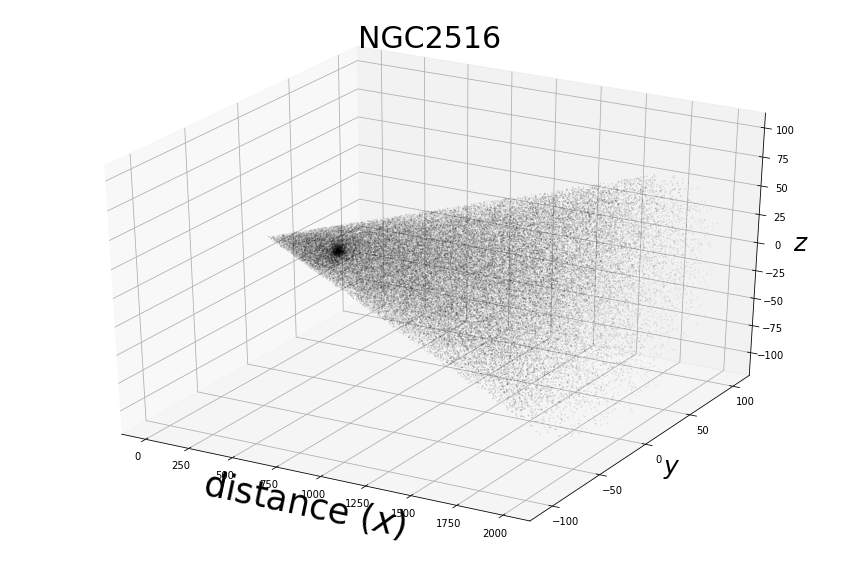

In [24]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(data3_cartesian[:,0], data3_cartesian[:,1], data3_cartesian[:,2], zdir='z', s=0.01, c='k', depthshade=True)
ax.set_xlabel('distance ($x$)', fontsize=35); ax.set_ylabel('$y$', fontsize=25); ax.set_zlabel('$z$', fontsize=25)
ax.set_title('NGC2516', fontsize=30)
#ax.view_init(30, 60)
plt.show()

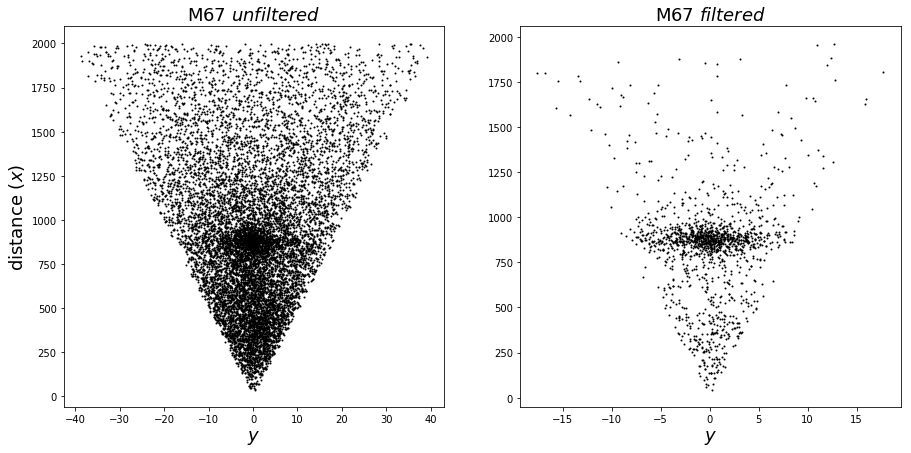

In [11]:
plt.figure(figsize=(15,7))
plt.subplot(121)
plt.title('M67 $unfiltered$', fontsize=18)
plt.scatter(data_cartesian[:,1],data_cartesian[:,0],s=1,c='k')
plt.ylabel('distance ($x$)', fontsize=18)
plt.xlabel('$y$', fontsize=18); plt.subplot(122); plt.xlabel('$y$', fontsize=18)
plt.title('M67 $filtered$', fontsize=18)
plt.scatter(data2_cartesian[:,1],data2_cartesian[:,0],s=1,c='k')
plt.show()

In [27]:
#plt.scatter(data3_cartesian[:,0],data3_cartesian[:,5],s=1,c='k')
#plt.plot(data3_cartesian[:,0],0.1*np.ones(len(data3_cartesian[:,0])))
#plt.grid(True)
#plt.show()

### RGB Plotting

In [9]:
# Plot the HD diagram
def HRD(data, dataname = "", size=0.1, colorbar = True) :
    parallax = 1000./data[:,2]
    
    G_bar = data[:,5] + 5*np.log10(parallax) + 2
    G_max = np.max(G_bar)
    G_min = np.min(G_bar)
    
    plt.figure(figsize=(15,6))
    plt.subplot(121)
    plt.title(dataname, fontsize=20)
    if colorbar : 
        plt.scatter(data[:,6]-data[:,5], G_bar, s=size, c=data[:,2], cmap='gist_stern')
        clb = plt.colorbar()
        clb.set_label('distance', labelpad=-40, y=1.05, rotation=0)
    else : plt.scatter(data[:,6]-data[:,5], G_bar, s=1, c='k')
    plt.ylim(G_max, G_min)
    plt.xlabel('$B_p - G$', fontsize=18)
    plt.ylabel(r'$G + 5 * log_{10}\bar{\omega} + 2$', fontsize=22)
    plt.subplot(122)
    plt.title(dataname, fontsize=20)
    if colorbar : 
        plt.scatter(data[:,5]-data[:,7], G_bar, s=size, c=data[:,2], cmap='gist_stern')
        clb = plt.colorbar()
        clb.set_label('distance', labelpad=-40, y=1.05, rotation=0)
    else : plt.scatter(data[:,5]-data[:,6], G_bar, s=1, c='k')
    plt.ylim(G_max, G_min)
    plt.xlabel('$G - R_p$', fontsize=18)
    plt.show()

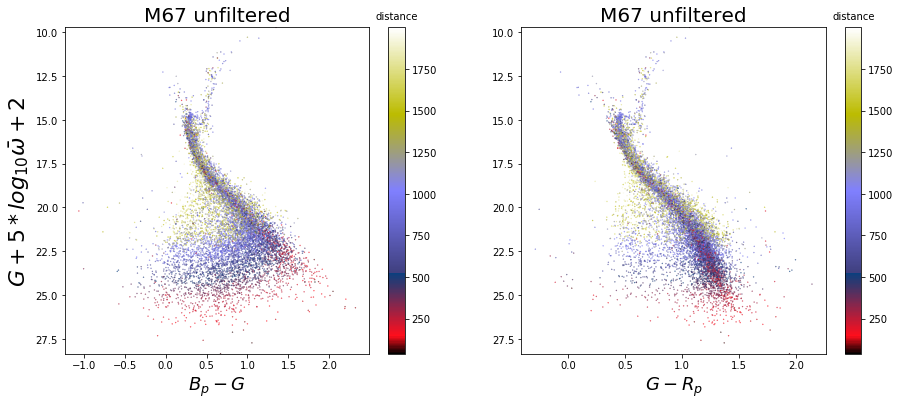

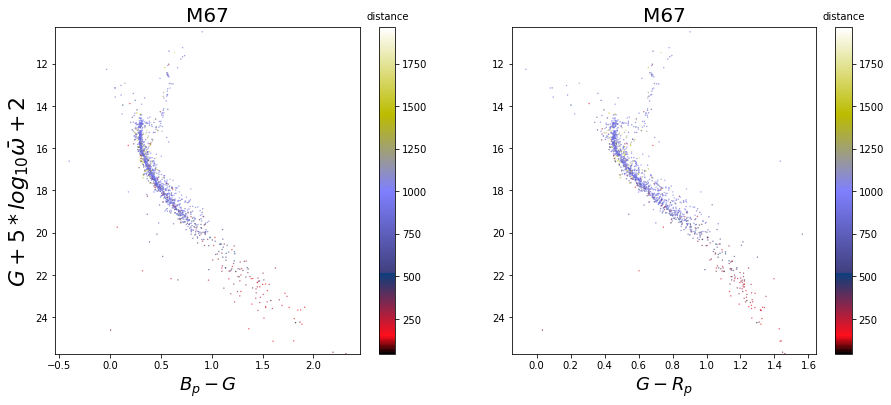

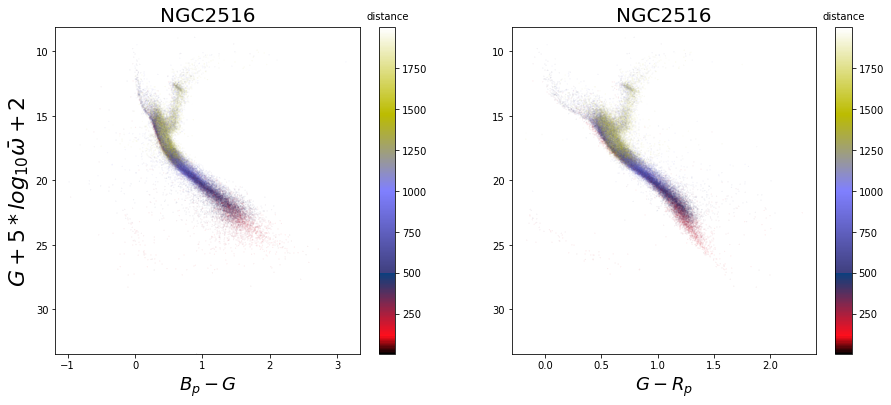

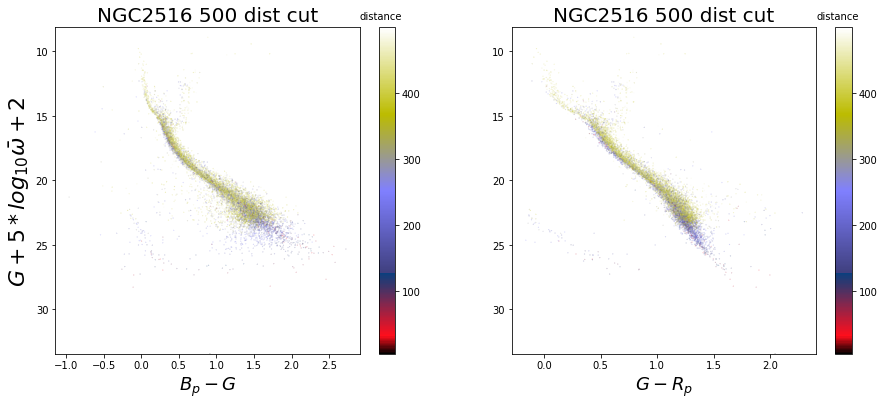

In [13]:
HRD(data, "M67 unfiltered", size=0.1, colorbar=True)
HRD(data2, "M67", size=0.1, colorbar=True)
HRD(data3, "NGC2516", size=0.001, colorbar=True)
i1 = np.where((data3[:,2] < 500))[0]
HRD(data3[i1,:], "NGC2516 500 dist cut", size=0.01, colorbar=True)

# -----------------
## Plotting before clustering

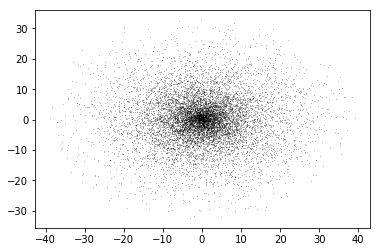

In [14]:
plt.scatter(data_cartesian[:,1],data_cartesian[:,2],s=0.01,c='k')
plt.show()

In [15]:
def plot_information(data) :
    plt.figure(figsize=(22,19))
    for i in (0,2,3,4) :
        if i == 0 : j = 1
        else      : j = i
        plt.subplot(2,2,j)
        plt.scatter(data[:,1],data[:,i],s=1,c='k')
        plt.xlabel(data_name[1], fontsize=25)
        plt.ylabel(data_name[i], fontsize=25)
    plt.show()
    HRD(data, size=0.1, colorbar=True)

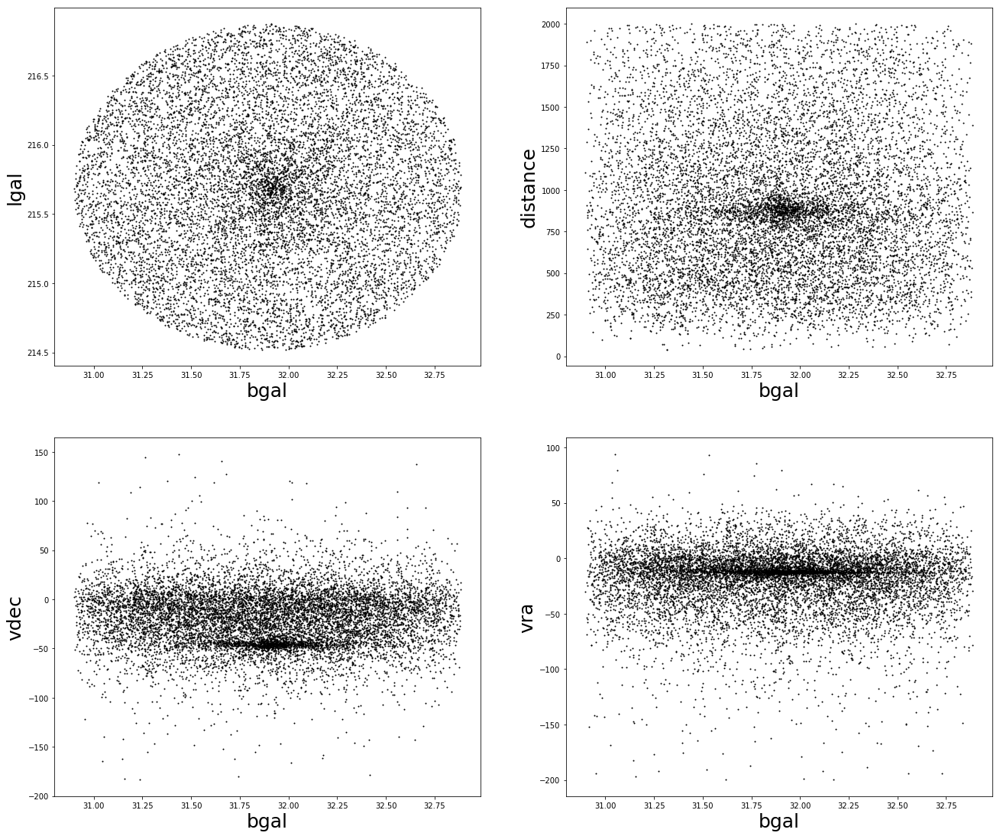

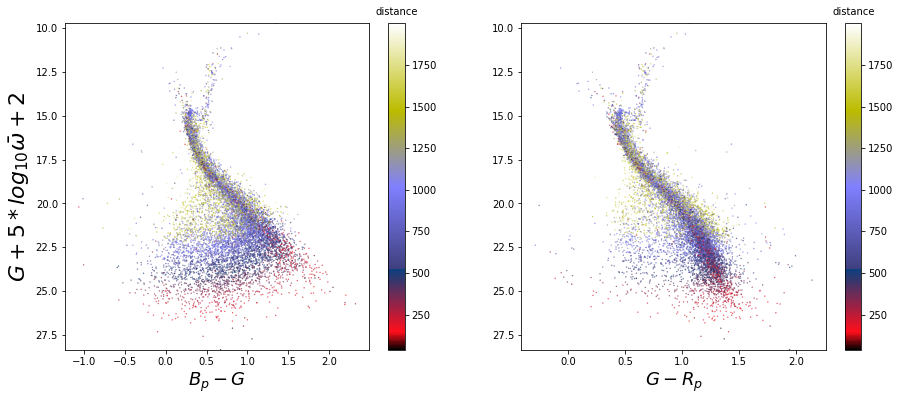

In [16]:
plot_information(data)

## Clustering

In [81]:
## fitted cluster in k-means
nclust = 12
print("## computing k-means...")

# KMeans for each normalisation
kmeans = KMeans(n_clusters=nclust, max_iter = 2000, n_init = 50)
kmeans.fit(datask)
kmeans_nor0 = KMeans(n_clusters=nclust, max_iter = 2000, n_init = 50)
kmeans_nor0.fit(datanor0)
kmeans_nor1 = KMeans(n_clusters=nclust, max_iter = 2000, n_init = 50)
kmeans_nor1.fit(datanor1)
kmeans_nor2 = KMeans(n_clusters=nclust, max_iter = 2000, n_init = 50)
kmeans_nor2.fit(datanor2)

# Centroid for each normalisation
centroid = kmeans.cluster_centers_
centroid_nor0 = np.multiply(kmeans_nor0.cluster_centers_, normalization_vector0)
centroid_nor1 = np.multiply(kmeans_nor1.cluster_centers_, normalization_vector1)
centroid_nor2 = unnormalization0_1(kmeans_nor2.cluster_centers_, normalization_vector2, weight)

# Labels for each normalisation
labels = kmeans.labels_
labels_nor0 = kmeans_nor0.labels_
labels_nor1 = kmeans_nor1.labels_
labels_nor2 = kmeans_nor2.labels_

## computing k-means...


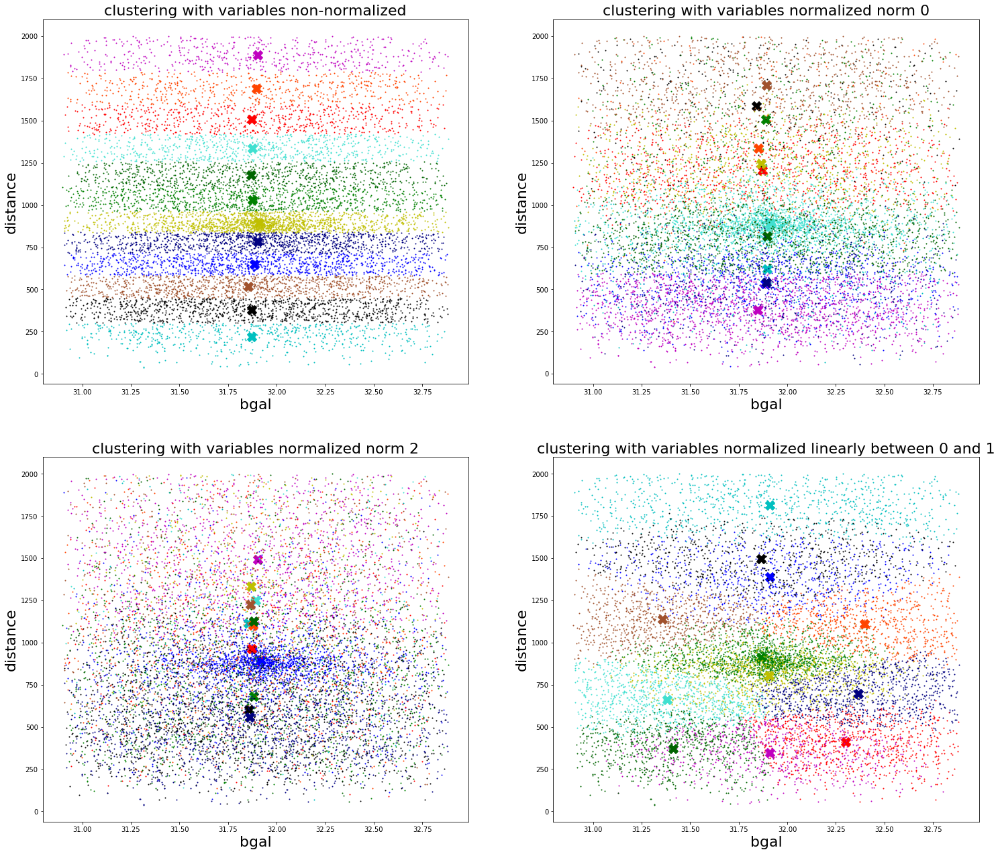

In [92]:
# Plotting i2 with respect to i1
# (0 = lgal; 1 = bgal; 2 = distance...)
i1 = 1
i2 = 2

j = 1
plt.figure(figsize=(25,22))
centro = [centroid,centroid_nor0,centroid_nor1,centroid_nor2]
for lab in (labels,labels_nor0,labels_nor1,labels_nor2) :
    plt.subplot(2,2,j)
    for i in range(nclust):
        ilabel = np.where(lab == i)[0]
        plt.scatter(datask[ilabel,i1],datask[ilabel,i2],s=1,c=colors[i])
        plt.scatter(centro[j-1][i,i1],centro[j-1][i,i2],s=200,c=colors[i],marker='X')
    plt.xlabel(data_name[i1], fontsize=22)
    plt.ylabel(data_name[i2], fontsize=22)
    plt.title("clustering with variables " + string[j-1], fontsize=22)
    j+=1
    
plt.show()

### Cluster plotting for data normalized linearly between 0 and 1

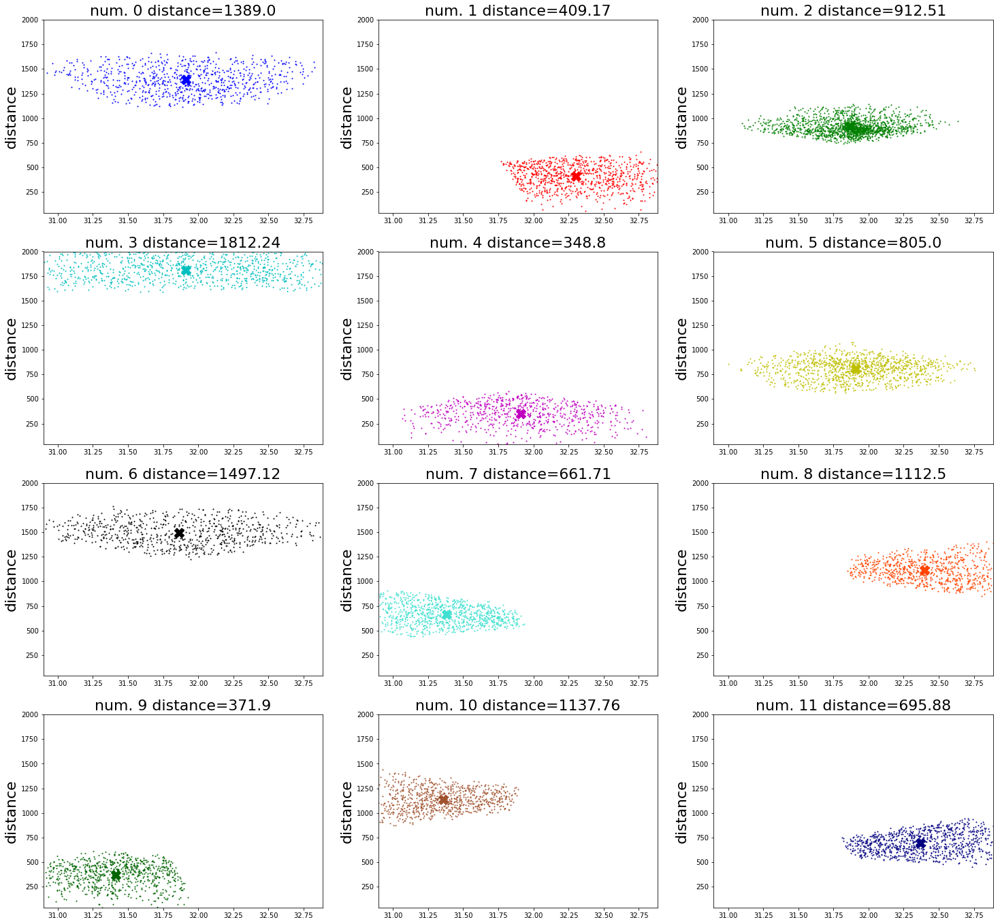

In [116]:
# Plotting i2 with respect to i1
# (0 = lgal; 1 = bgal; 2 = distance...)
i1 = 1
i2 = 2

plt.figure(figsize=(25,((nclust-1)//3+1)*6))
for i in range(nclust):
    plt.subplot((nclust-1)//3+1,3,i+1)
    ilabel = np.where(labels_nor2 == i)[0]
    plt.scatter(datask[ilabel,i1],datask[ilabel,i2],s=1,c=colors[i])
    plt.scatter(centroid_nor2[i,i1],centroid_nor2[i,i2],s=200,c=colors[i],marker='X')
    #plt.xlabel(data_name[i1], fontsize=22)
    plt.ylabel(data_name[i2], fontsize=22)
    plt.title("num. " + str(i) + " " + data_name[i2] + "=" + str(round(centroid_nor2[i,i2],2)), fontsize=22)
    plt.xlim(np.min(datask[:,i1]), np.max(datask[:,i1]))
    plt.ylim(np.min(datask[:,i2]), np.max(datask[:,i2]))
    
plt.show()

In [ ]:
#for d in (1,2,3,4,5,8,10) :
d = 2
weight = [1, 1, d, 1, 1]
data01, normalization_vector01 = normalization0_1(datask, weight)

plt.figure(figsize=(25,23))
i1 = 1
i2 = 2

for n in range(2,14) :

    kmeans_01 = KMeans(n_clusters=n, max_iter = 2000, n_init = 50)
    kmeans_01.fit(data01)

    centroid_01 = unnormalization0_1(kmeans_01.cluster_centers_, normalization_vector01, weight)
    labels_01 = kmeans_01.labels_


    plt.subplot(4,3,n-1)
    for i in range(n):
        ilabel = np.where(labels_01 == i)[0]
        plt.scatter(datask[ilabel,i1],datask[ilabel,i2],s=1,c=colors[i])
        plt.scatter(centroid_01[i,i1],centroid_01[i,i2],s=200,c=colors[i],marker='X')
    plt.xlabel(data_name[i1], fontsize=22)
    plt.ylabel(data_name[i2], fontsize=22)
    plt.title("num. of cluster : " + str(n), fontsize=22)
#plt.savefig('kmeans_cluser_[1-1-%s-1-1].png'%(d))
plt.show()

# -------------------------------------------------------------
# Hierarchical Clustering Method

In [10]:
# weight vector to allocate to each component
weight = [1, 1, 3, 3, 3, 1, 1, 1]
weight_cart = [2, 1, 1, 2, 2, 1, 1, 1]

data_nor, normalization_vector = normalization0_1(data, weight)
data_cart_nor, normalization_vector_cart = normalization0_1(data_cartesian, weight_cart)

d = {'lgal': data_nor[:,0], 'bgal': data_nor[:,1], 'distance': data_nor[:,2], 'vra': data_nor[:,3], 'vdec': data_nor[:,4]}
data_pd = pd.DataFrame(data=d)

d = {'distance (x)': data_cart_nor[:,0], 'y': data_cart_nor[:,1], 'z': data_cart_nor[:,2], 'vra': data_cart_nor[:,3], 'vdec': data_cart_nor[:,4]}
data_cart_pd = pd.DataFrame(data=d)

In [451]:
print(data3.shape)
data_nor3, normalization_vector3 = normalization0_1(data3, weight)
d = {'lgal': data_nor3[:,0], 'bgal': data_nor3[:,1], 'distance': data_nor3[:,2], 'vra': data_nor3[:,3], 'vdec': data_nor3[:,4]}
data_pd3 = pd.DataFrame(data=d)
#Z3 = linkage(data_pd3, 'ward', metric='euclidean') # choix de la distance

(67190, 8)


In [11]:
Z = linkage(data_pd, 'ward', metric='euclidean') # choix de la distance
Z_cart = linkage(data_cart_pd, 'ward', metric='euclidean') # choix de la distance

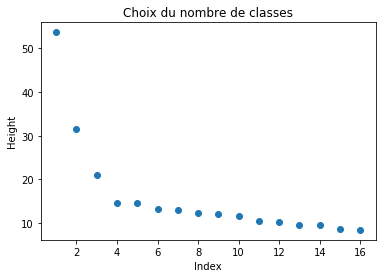

In [249]:
height = Z[:,2]  # Décroissance des sauts
x=np.arange(16)+1
height = sorted(height,reverse=True)
plt.scatter(x,height[0:16])  #height[0:16]/sum(height[0:16])*100
plt.xlabel('Index')
plt.ylabel('Height')
plt.title("Choix du nombre de classes")
plt.show()

In [12]:
# Return volume of the cube surrounding data
def distance_from_M67(data, cartesian):
    if cartesian : return abs(850-np.mean(data[:,0]))/2000+abs(np.mean(data[:,1]))/60
    else : return abs(850-np.mean(data[:,2]))/2000+abs(31.85-np.mean(data[:,1]))/2

def hierarchical_plot(Z_linkage, data, cartesian=False, i1=0, i2=2, nb_plot=12):
    # Plotting i2 with respect to i1
    # (0 = lgal; 1 = bgal; 2 = distance...)
    height = sorted(Z_linkage[:,2],reverse=True)
    nb_ind_classes = []
    for nclust in np.arange(2,nb_plot+1,2) :
        plt.figure(figsize=(17,2.5))
        plt.subplot(121)
        classes = fcluster(Z_linkage,t=height[nclust-1],criterion='distance')
        distance = np.zeros(nclust)
        for i in range(nclust):
            ilabel = np.where(classes == i+1)[0]
            plt.scatter(data[ilabel,i1],data[ilabel,i2],s=0.1,c=colors[i%len(colors)])
            distance[i] = distance_from_M67(data[ilabel,:5],cartesian)
        plt.xlabel(data_name_cart[cartesian*1][i1], fontsize=22)
        plt.ylabel(data_name_cart[cartesian*1][i2], fontsize=22)
        plt.title("clustering with "+str(nclust)+" classes", fontsize=18)
        xlim = plt.xlim(); ylim = plt.ylim()
        
        plt.subplot(122)
        index = np.argmin(distance)
        ilabel = np.where(classes == index+1)[0]
        plt.scatter(data[ilabel,i1],data[ilabel,i2],s=0.1,c=colors[index%len(colors)])
        plt.xlim(xlim);    plt.ylim(ylim)
        plt.title("closest classe, nb stars = "+str(len(ilabel)), fontsize=18)
        plt.show()

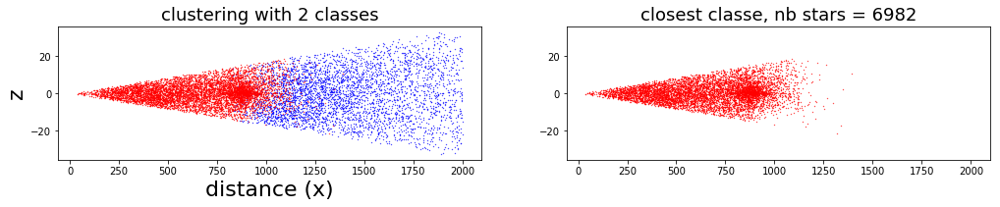

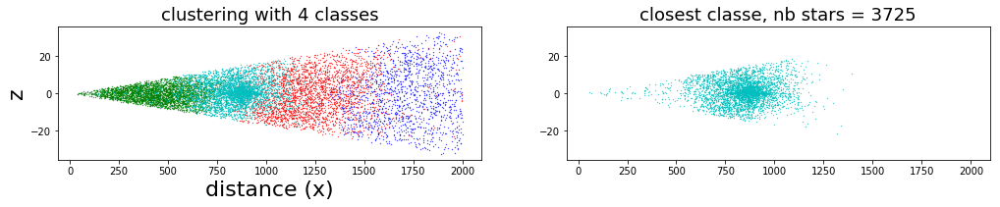

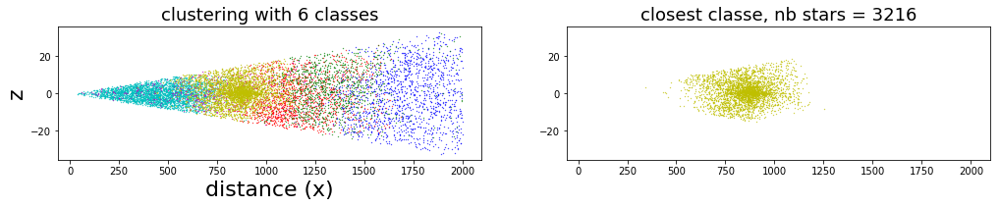

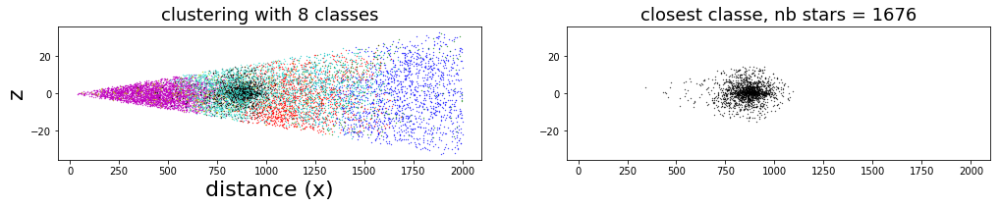

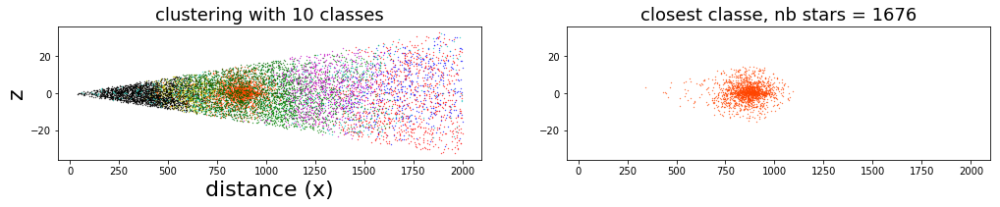

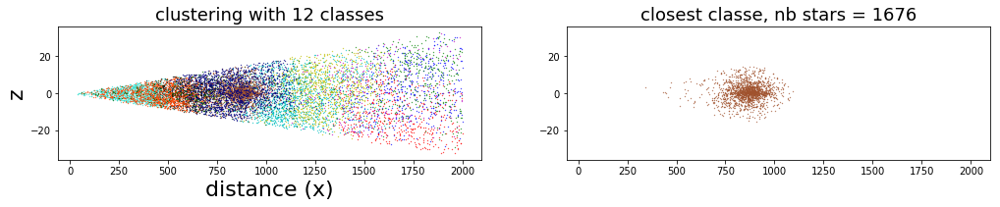

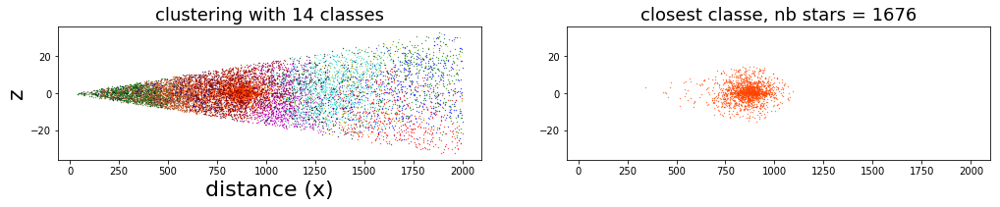

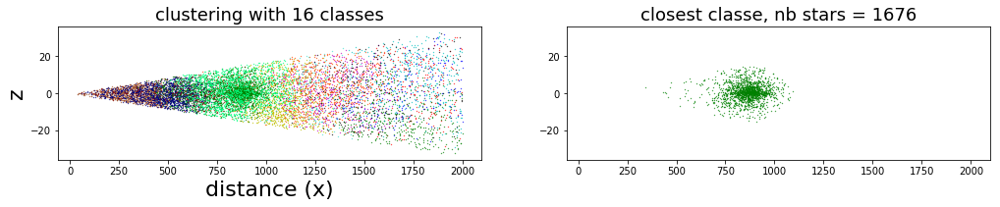

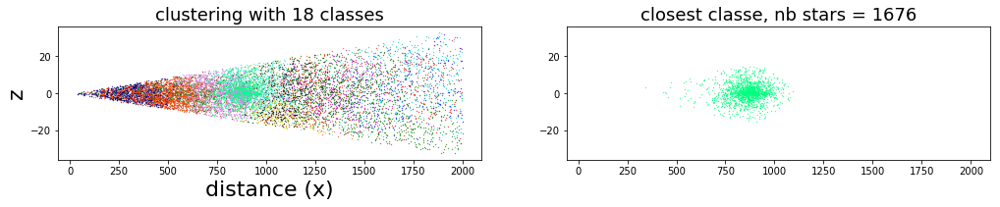

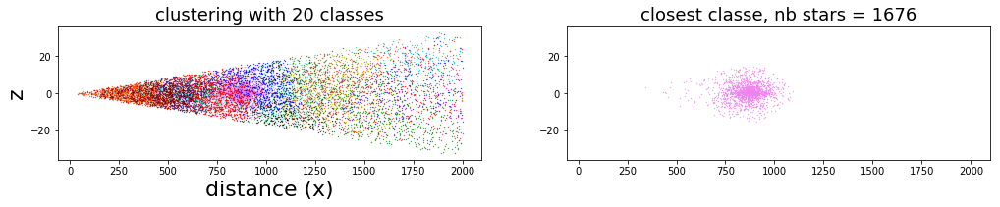

In [411]:
hierarchical_plot(Z_cart, data_cartesian, True, nb_plot=20)

In [13]:
def hierarchical_classes_plot(Z_linkage, data, cartesian=False, nb_plot=30):
    height = sorted(Z_linkage[:,2],reverse=True)
    nb_ind_classes = []
    for nclust in np.arange(5,nb_plot+1) :
        classes = fcluster(Z_linkage,t=height[nclust-1],criterion='distance')
        variance = np.zeros(nclust);        nb_ind = np.zeros(nclust)
        for i in range(nclust):
            ilabel = np.where(classes == i+1)[0]
            variance[i] = distance_from_M67(data[ilabel,:5],cartesian)
            nb_ind[i] = len(ilabel)
        
        index = np.argmin(variance)        
        nb_ind_classes.append([nclust, nb_ind, index])
        
    plt.figure(figsize=(20,10))
    for i in nb_ind_classes :
        plt.scatter(np.ones(i[0])*i[0],sorted(i[1]),s=40,c=colors)
        #plt.scatter(i[0],i[1][i[2]],marker='X',s=100,c='k')
        plt.title("Number of stars for each classes from hierarchical clustering",fontsize=18)
        plt.ylabel("Number of stars per classes",fontsize=18)
        plt.xlabel("Number of classes",fontsize=18)
    plt.show()

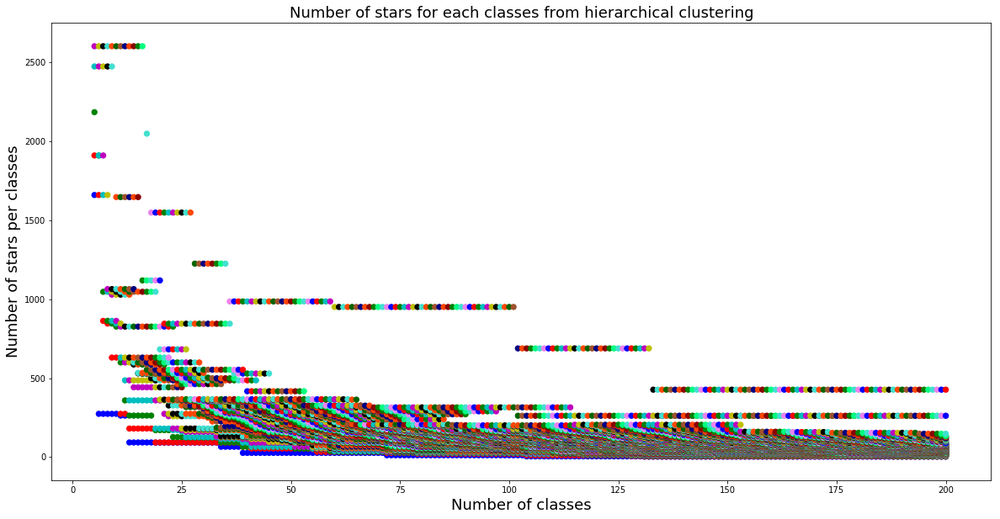

In [428]:
#hierarchical_classes_plot(Z_cart, data_cartesian, nb_plot=400)
hierarchical_classes_plot(Z, data, nb_plot=200)

In [311]:
def cluster_plot(data,ilabel,nclust,cartesian):
    plt.figure(figsize=(17,4))
    for i in (1,2,3,4) :
        plt.subplot(1,4,i)
        plt.tight_layout()
        plt.scatter(data[:,0],data[:,i],s=0.01,c='k')
        plt.scatter(data[ilabel,0],data[ilabel,i],s=0.5,c='r')
        plt.xlim(min(data[:,0]),max(data[:,0]));    plt.ylim(min(data[:,i]),max(data[:,i]))
        plt.title(str(nclust)+" classes, nb stars = "+str(len(ilabel)), fontsize=18)
        plt.xlabel(data_name_cart[cartesian*1][0], fontsize=18)
        plt.ylabel(data_name_cart[cartesian*1][i], fontsize=18)
    plt.show()
    """
    from mpl_toolkits.mplot3d import Axes3D
    fig = plt.figure(figsize=(15,10))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(data[:,2], data[:,0], data[:,1], zdir='z', s=0.1, c='k', depthshade=True)
    ax.scatter(data[ilabel,2], data[ilabel,0], data[ilabel,1], zdir='z', s=2, c='r', depthshade=True)
    ax.set_xlabel('distance', fontsize=35); ax.set_ylabel('$lgal$', fontsize=25); ax.set_zlabel('$bgal$', fontsize=25)
    ax.set_title(str(nclust)+" classes, nb stars = "+str(len(ilabel)), fontsize=18)
    #ax.view_init(30, 60)
    plt.show()
    """
    print("Mean Distance :"+str(round(np.mean(data[ilabel,(cartesian==False)*2]),2)))
    print("Mean Vdec :"+str(round(np.mean(data[ilabel,3]),2)))
    print("Mean Vra :"+str(round(np.mean(data[ilabel,4]),2)))

#Plotting the largest cluster for each number of classes for hierarchical clustering
def hierarchical_largest_classes_plot(Z_linkage, data, cartesian=False, nb_plot=30):
    height = sorted(Z_linkage[:,2],reverse=True)
    previous = 0
    for nclust in np.arange(4,nb_plot+1) :
        classes = fcluster(Z_linkage,t=height[nclust-1],criterion='distance')
        nb_ind = np.zeros(nclust)
        ilabel_list = [] # cluster label list
        for i in range(nclust):
            ilabel = np.where(classes == i+1)[0]
            ilabel_list.append(ilabel)
            nb_ind[i] = len(ilabel)
        # if the largest cluster doesn't change, we don't plot
        if max(nb_ind) != previous :
            previous = max(nb_ind)
            index = np.argmax(nb_ind) 
            ilabel = ilabel_list[index]
            cluster_plot(data,ilabel,nclust,cartesian) #Plotting

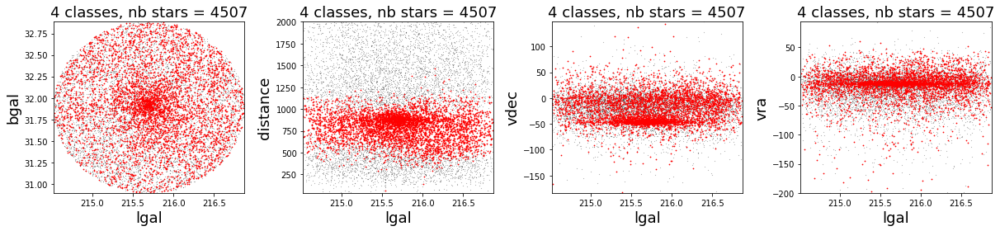

Mean Distance :794.76
Mean Vdec :-22.5
Mean Vra :-14.4


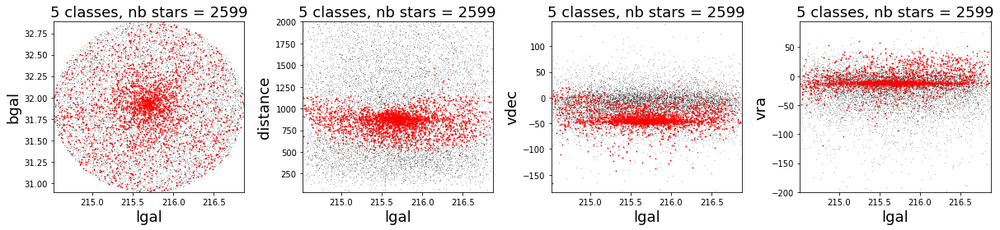

Mean Distance :847.65
Mean Vdec :-40.44
Mean Vra :-8.37


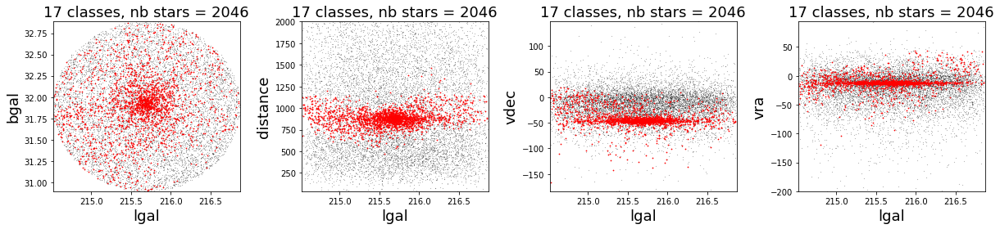

Mean Distance :885.99
Mean Vdec :-42.07
Mean Vra :-11.78


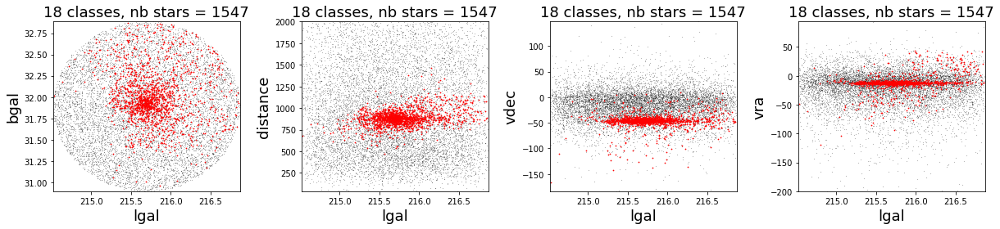

Mean Distance :888.25
Mean Vdec :-46.23
Mean Vra :-12.1


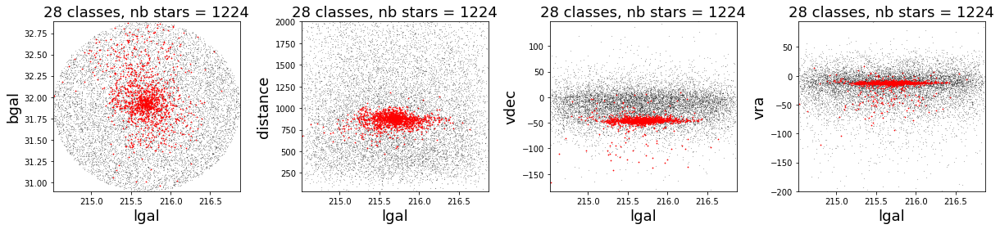

Mean Distance :860.96
Mean Vdec :-46.61
Mean Vra :-14.84


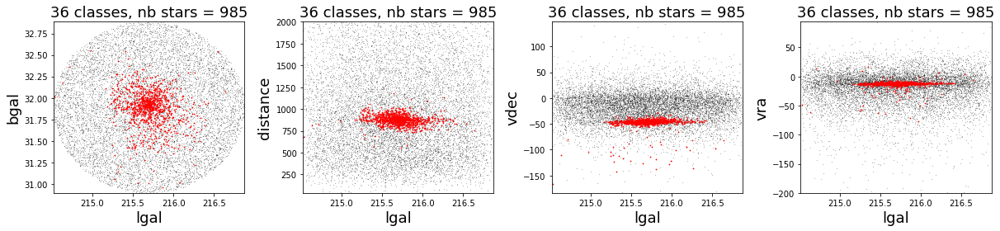

Mean Distance :877.25
Mean Vdec :-47.71
Mean Vra :-13.0


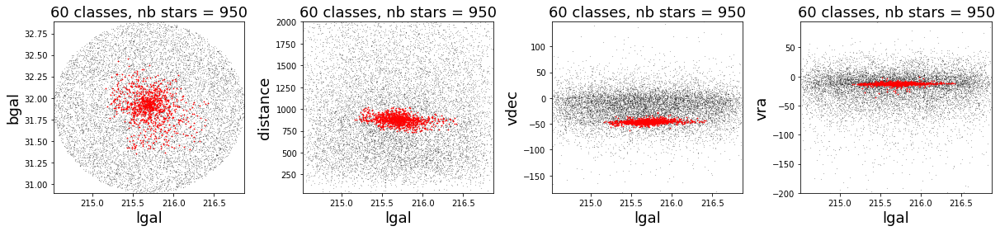

Mean Distance :877.71
Mean Vdec :-45.59
Mean Vra :-12.45


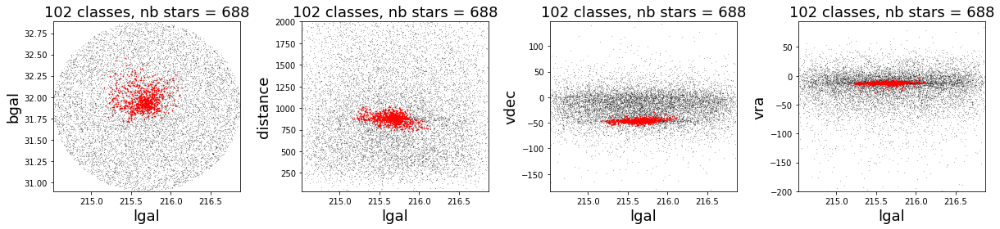

Mean Distance :879.37
Mean Vdec :-45.7
Mean Vra :-12.51


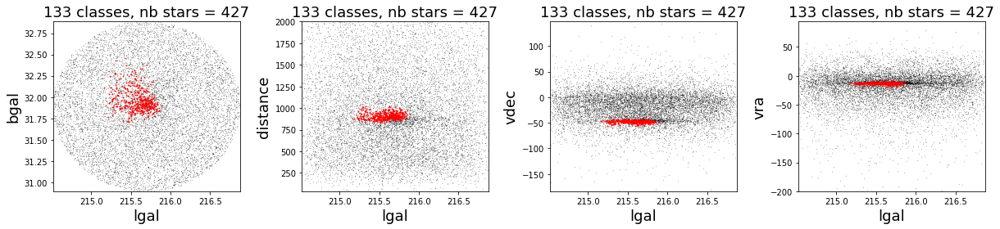

Mean Distance :909.82
Mean Vdec :-47.44
Mean Vra :-12.87


In [461]:
#hierarchical_largest_classes_plot(Z_cart, data_cartesian, cartesian=True,nb_plot=150)
hierarchical_largest_classes_plot(Z, data, cartesian=False, nb_plot=150)

In [15]:
# weight vector to allocate to each component
weight = [1, 1, 3, 3, 3, 1, 1, 1]
weight_cart = [2, 1, 1, 2, 2, 1, 1, 1]

data2_nor, normalization_vector = normalization0_1(data2, weight)
data2_cart_nor, normalization_vector_cart = normalization0_1(data2_cartesian, weight_cart)

d = {'lgal': data2_nor[:,0], 'bgal': data2_nor[:,1], 'distance': data2_nor[:,2], 'vra': data2_nor[:,3], 'vdec': data2_nor[:,4]}
data2_pd = pd.DataFrame(data=d)

d = {'distance (x)': data2_cart_nor[:,0], 'y': data2_cart_nor[:,1], 'z': data2_cart_nor[:,2], 'vra': data2_cart_nor[:,3], 'vdec': data2_cart_nor[:,4]}
data2_cart_pd = pd.DataFrame(data=d)

Z2 = linkage(data2_pd, 'ward', metric='euclidean') # choix de la distance
Z2_cart = linkage(data2_cart_pd, 'ward', metric='euclidean') # choix de la distance

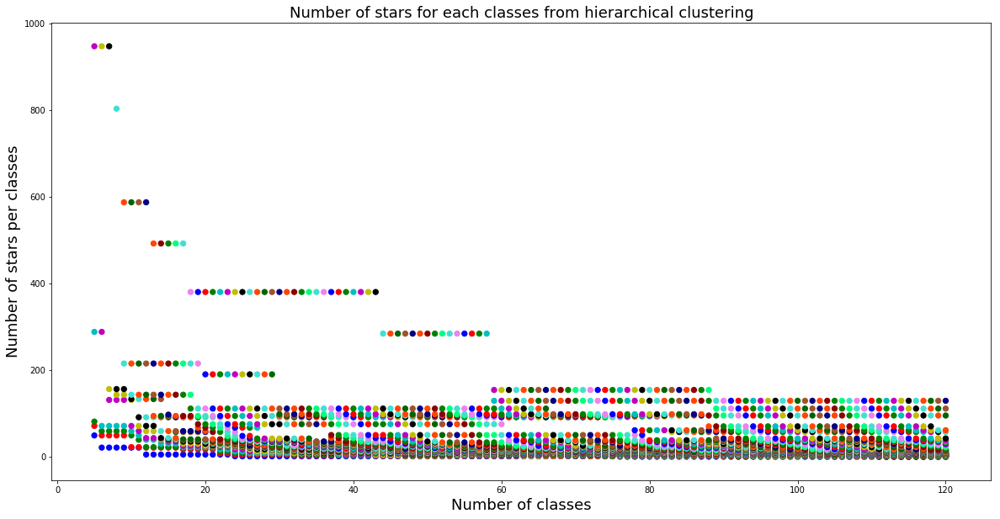

In [16]:
hierarchical_classes_plot(Z2, data2, nb_plot=120)

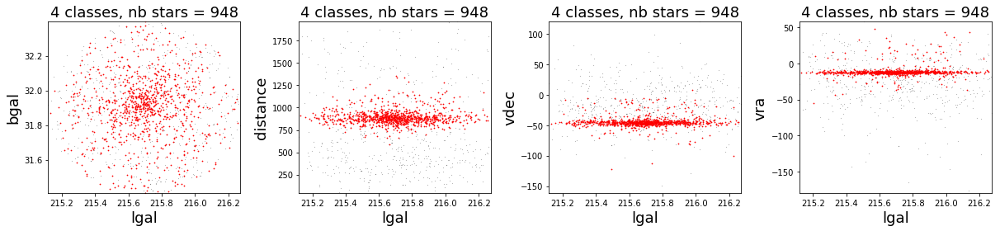

Mean Distance :894.13
Mean Vdec :-44.63
Mean Vra :-11.36


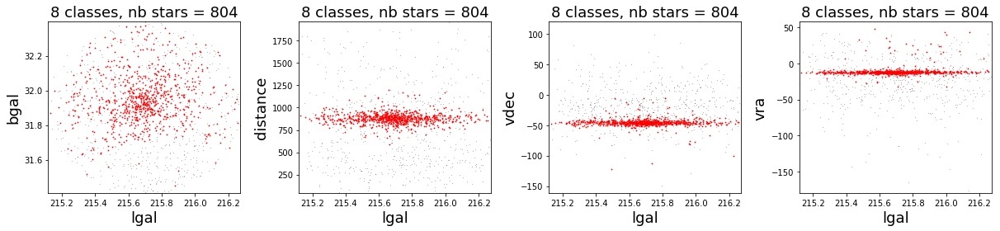

Mean Distance :881.16
Mean Vdec :-45.59
Mean Vra :-11.25


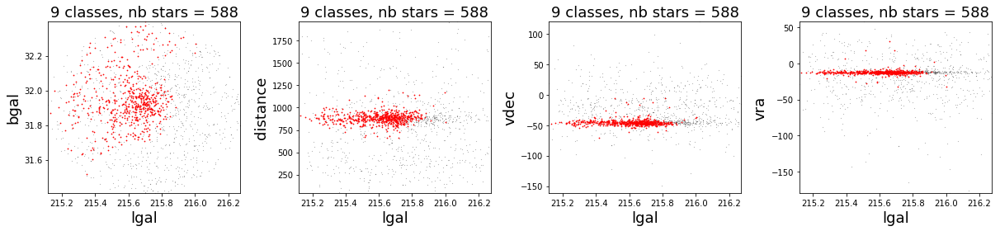

Mean Distance :886.11
Mean Vdec :-45.34
Mean Vra :-12.36


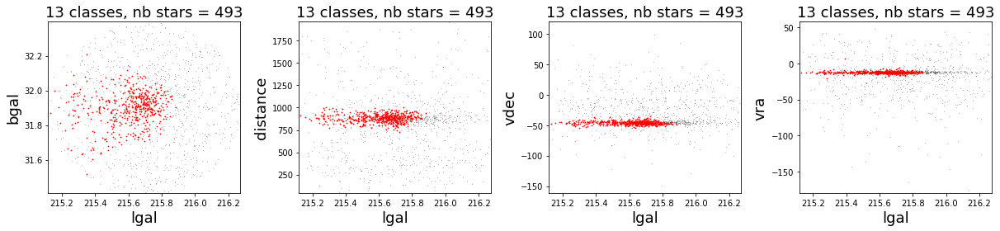

Mean Distance :883.66
Mean Vdec :-45.94
Mean Vra :-12.42


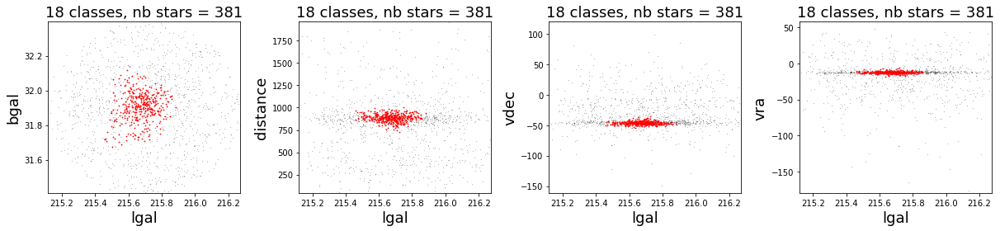

Mean Distance :886.38
Mean Vdec :-46.12
Mean Vra :-12.45


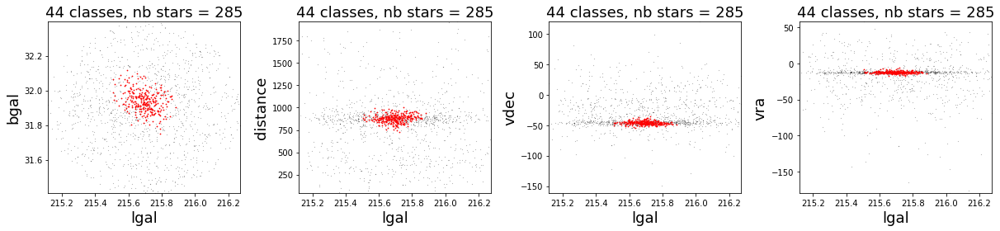

Mean Distance :879.88
Mean Vdec :-45.8
Mean Vra :-12.3


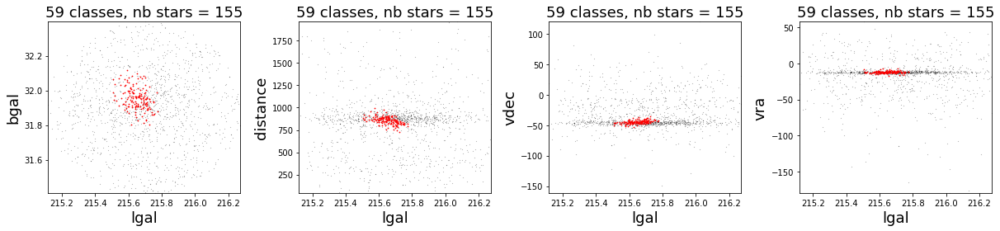

Mean Distance :856.9
Mean Vdec :-44.46
Mean Vra :-11.99


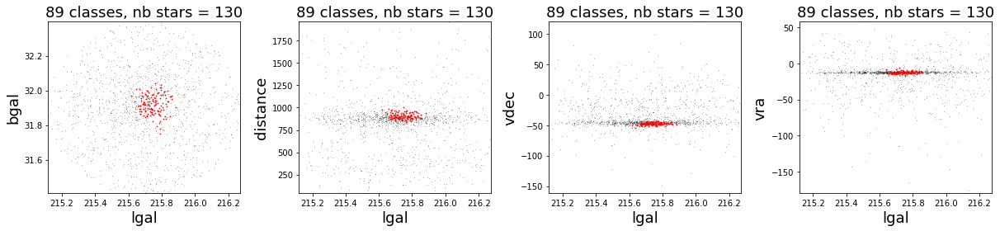

Mean Distance :907.28
Mean Vdec :-47.41
Mean Vra :-12.66


In [29]:
hierarchical_largest_classes_plot(Z2, data2, cartesian=False, nb_plot=100)

In [255]:
# weight vector to allocate to each component
weight = [1, 1, 8, 2, 2, 1, 1, 1]
weight_cart = [2, 1, 1, 2, 2, 1, 1, 1]

data3_nor, normalization_vector = normalization0_1(data3, weight)
data3_cart_nor, normalization_vector_cart = normalization0_1(data3_cartesian, weight_cart)

d = {'lgal': data3_nor[:,0], 'bgal': data3_nor[:,1], 'distance': data3_nor[:,2], 'vra': data3_nor[:,3], 'vdec': data3_nor[:,4]}
data3_pd = pd.DataFrame(data=d)

d = {'distance (x)': data3_cart_nor[:,0], 'y': data3_cart_nor[:,1], 'z': data3_cart_nor[:,2], 'vra': data3_cart_nor[:,3], 'vdec': data3_cart_nor[:,4]}
data3_cart_pd = pd.DataFrame(data=d)

Z3 = linkage(data3_pd[::6], 'ward', metric='euclidean') # choix de la distance
#Z3_cart = linkage(data3_cart_pd, 'ward', metric='euclidean') # choix de la distance

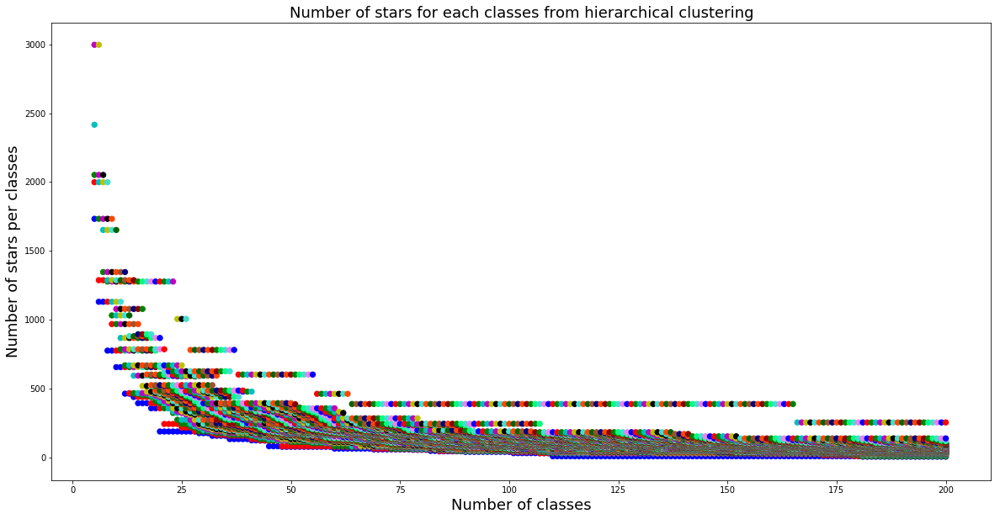

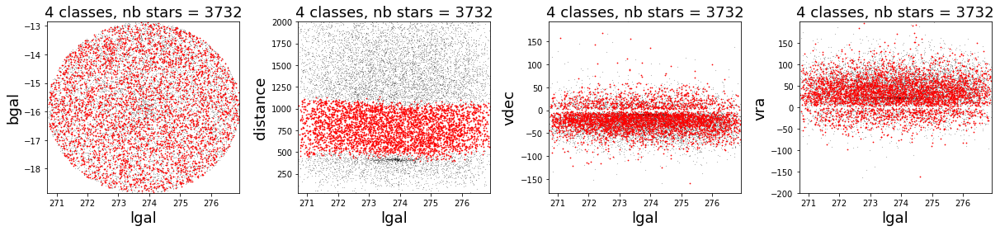

Mean Distance :776.76
Mean Vdec :-18.51
Mean Vra :31.47


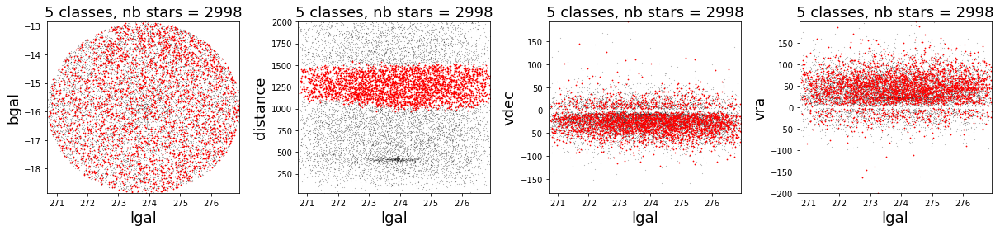

Mean Distance :1263.91
Mean Vdec :-25.31
Mean Vra :42.58


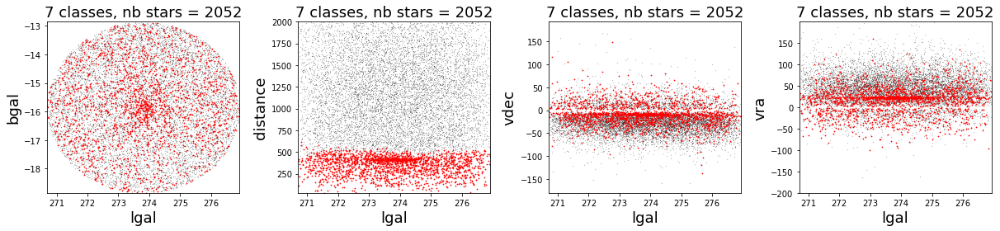

Mean Distance :349.76
Mean Vdec :-9.05
Mean Vra :16.28


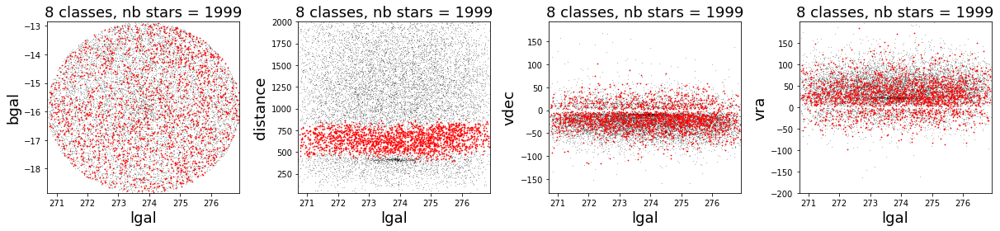

Mean Distance :646.86
Mean Vdec :-17.37
Mean Vra :28.05


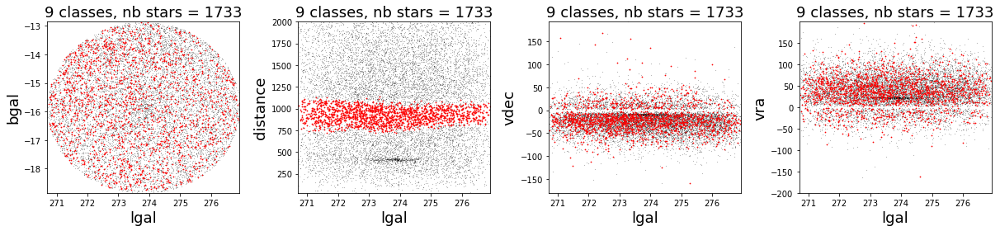

Mean Distance :926.58
Mean Vdec :-19.82
Mean Vra :35.4


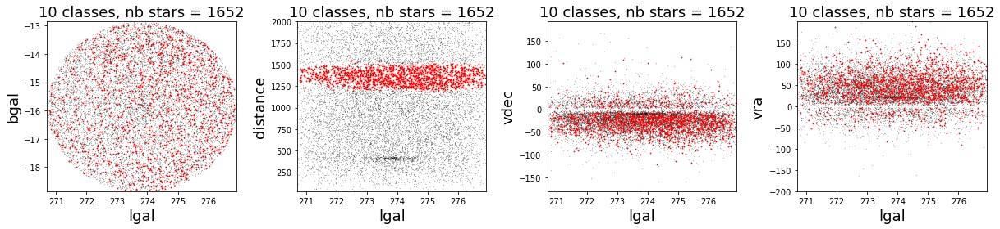

Mean Distance :1358.9
Mean Vdec :-26.12
Mean Vra :45.44


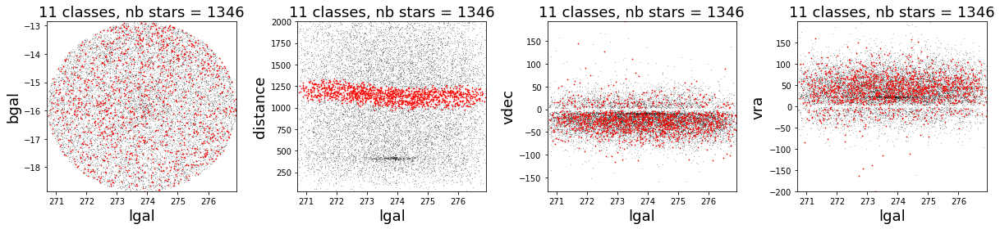

Mean Distance :1147.33
Mean Vdec :-24.31
Mean Vra :39.08


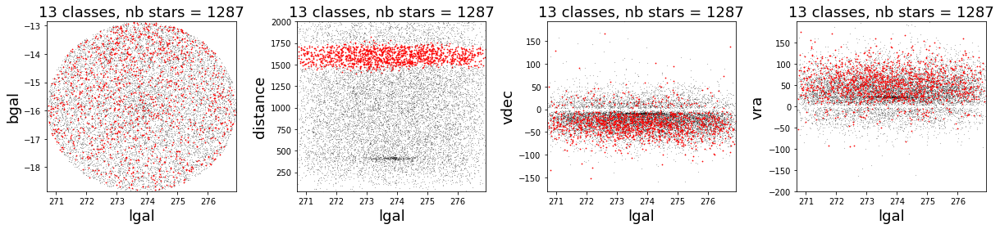

Mean Distance :1598.01
Mean Vdec :-31.34
Mean Vra :53.21


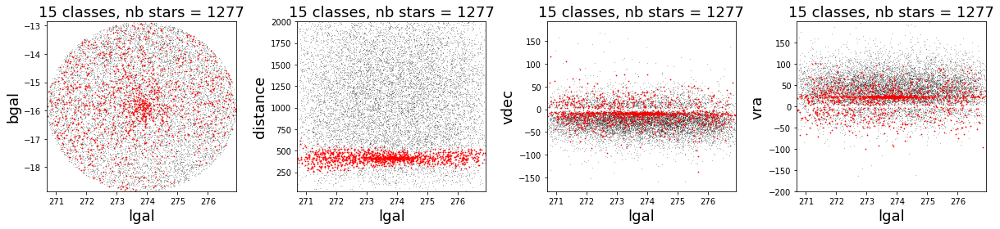

Mean Distance :416.44
Mean Vdec :-8.87
Mean Vra :15.87


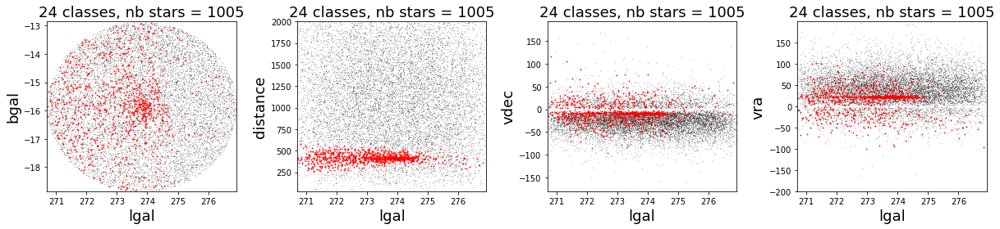

Mean Distance :416.52
Mean Vdec :-6.92
Mean Vra :13.94


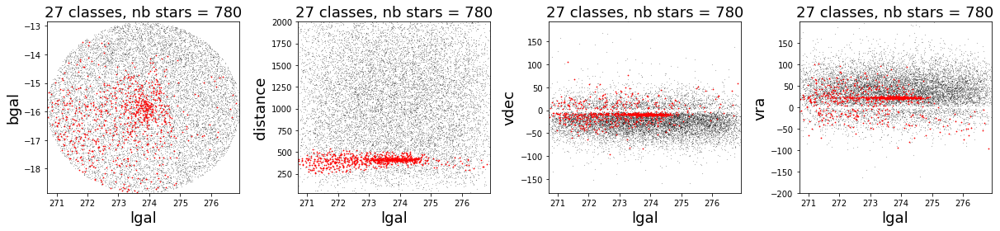

Mean Distance :405.95
Mean Vdec :-7.33
Mean Vra :15.81


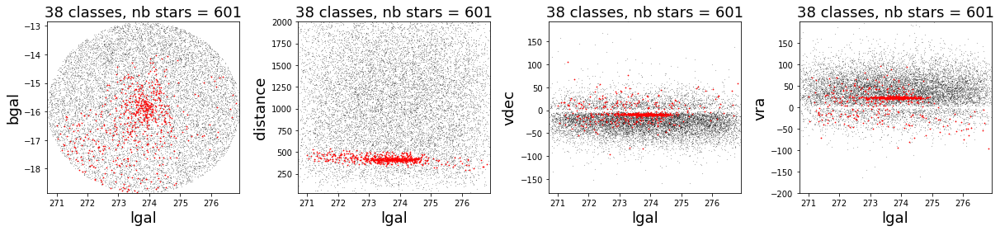

Mean Distance :420.5
Mean Vdec :-6.22
Mean Vra :14.34


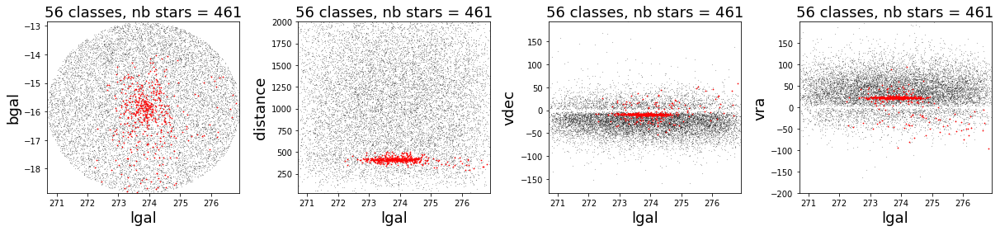

Mean Distance :413.62
Mean Vdec :-7.39
Mean Vra :15.04


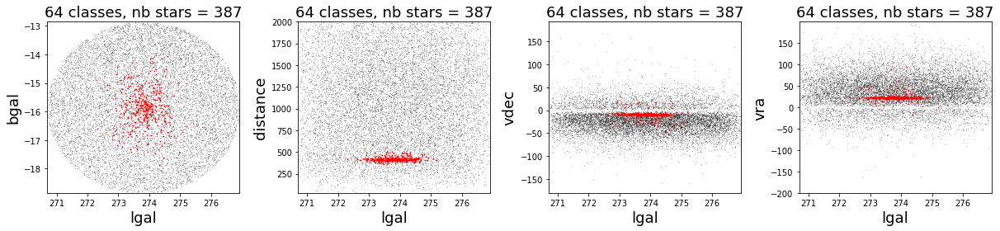

Mean Distance :420.22
Mean Vdec :-10.08
Mean Vra :22.63


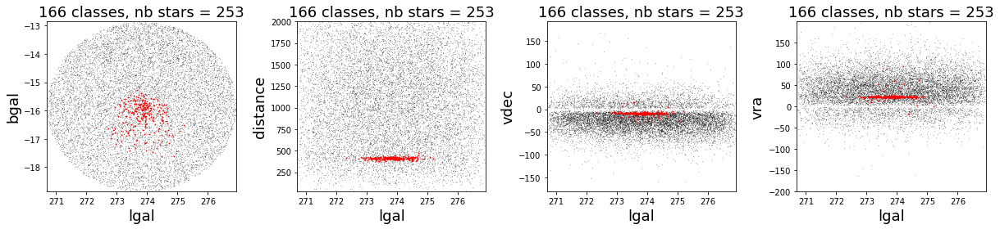

Mean Distance :413.29
Mean Vdec :-9.0
Mean Vra :22.54


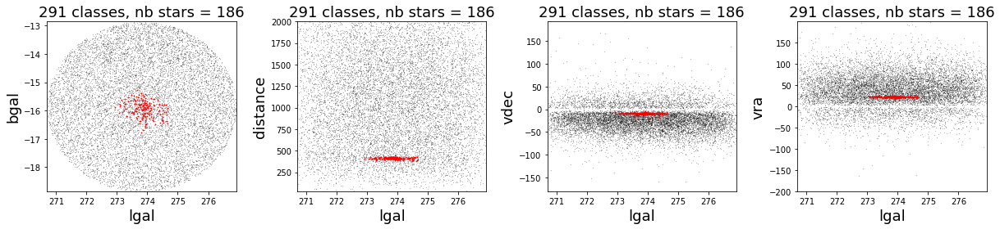

Mean Distance :412.88
Mean Vdec :-9.21
Mean Vra :21.86


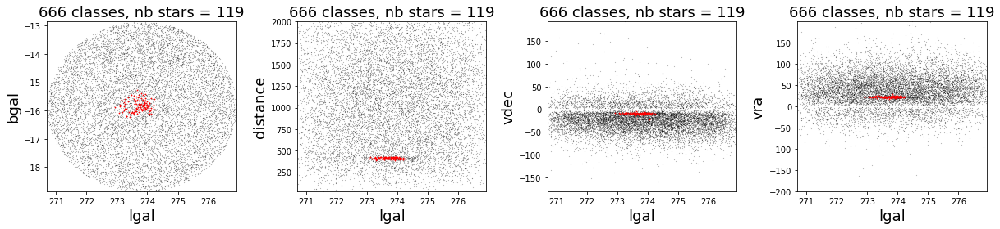

Mean Distance :413.74
Mean Vdec :-9.3
Mean Vra :21.88


In [256]:
hierarchical_classes_plot(Z3, data3[::6,:], nb_plot=200)
hierarchical_largest_classes_plot(Z3, data3[::6,:], cartesian=False, nb_plot=1000)

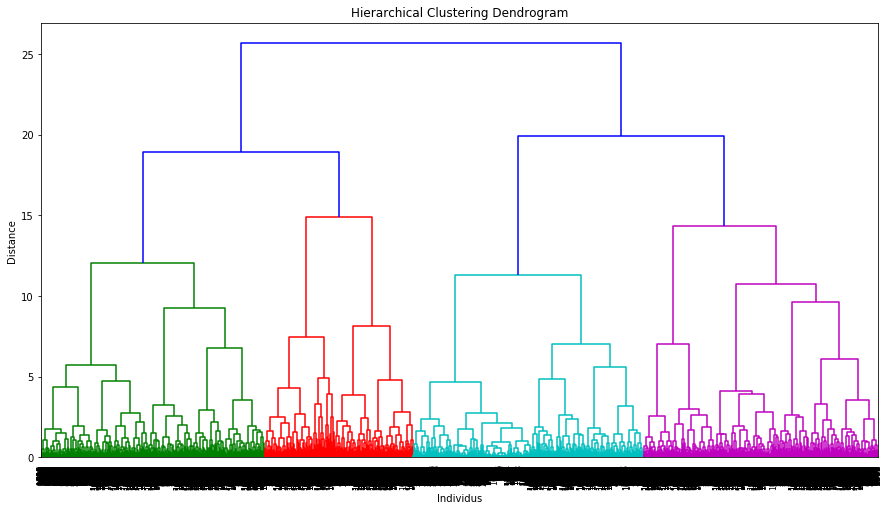

In [111]:
plt.figure(figsize=(15, 8))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Individus')
plt.ylabel('Distance')
dendrogram(Z,leaf_font_size=8.,labels=data_pd.index)
plt.show()

# -------------------------------------------------------------
# DBSCAN Clustering Method

In [211]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.preprocessing import StandardScaler

In [212]:
def affichage_cluster3D(data, ilabel, cartesian=False, size=0.1, title=""):
    if cartesian : i = [0,1,2]
    else :         i = [2,0,1]
    data_name_cart[cartesian*1][i[0]]
    fig = plt.figure(figsize=(15,10))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(data_test[:,i[0]], data_test[:,i[1]], data_test[:,i[2]], zdir='z', s=size, c='k', depthshade=True)
    ax.scatter(data_test[ilabel,0], data_test[ilabel,1], data_test[ilabel,2], zdir='z', s=15*size, c='r', depthshade=True)
    ax.set_xlabel(data_name_cart[cartesian*1][i[0]], fontsize=30); ax.set_ylabel(data_name_cart[cartesian*1][i[1]], fontsize=30); ax.set_zlabel(data_name_cart[cartesian*1][i[2]], fontsize=30)
    ax.set_title(title+" cluster size : "+str(len(ilabel)), fontsize=25)
    #ax.view_init(30, 60) #Pour rotation
    plt.show()

In [337]:
np.std(data[:,3])
a = (data[:,:5]-np.mean(data[:,:5]))/np.std(data[:,:5])
print(np.mean(a))
print(np.var(a))

5.0443411080029295e-17
1.0000000000000002


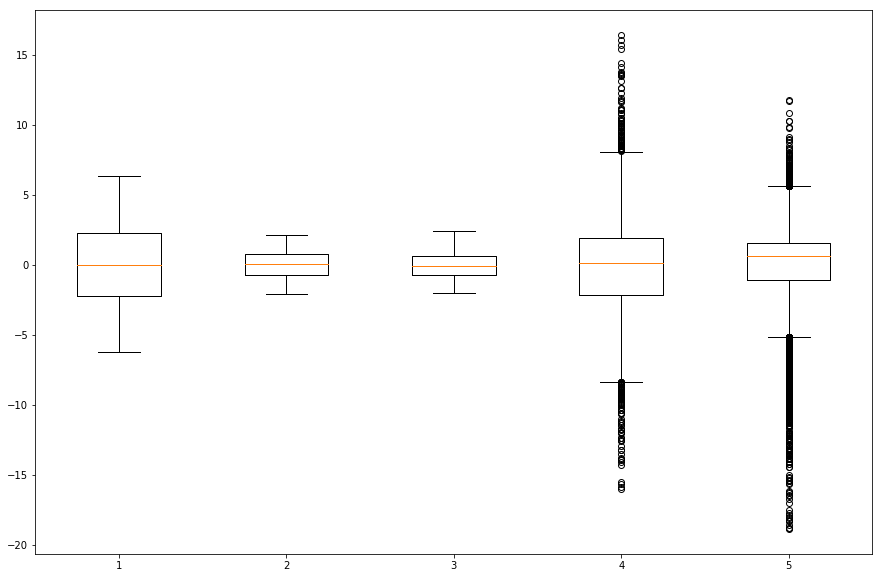

8.999999999999998
1.0
0.9999999999999998
8.999999999999998
8.999999999999996


In [305]:
weight = [3, 1, 1, 3, 3]
X = StandardScaler().fit_transform(data[:,:5])
#X2 = StandardScaler().fit_transform(data2[:,:5]*weight)
#X = StandardScaler().fit_transform(data3[::1,:5])
#X = StandardScaler().fit_transform(data3_cartesian[::1,:])
#X = StandardScaler().fit_transform(data_cartesian[::1,:5])
X = X*weight
plt.figure(figsize=(15,10))
plt.boxplot(X[:,:]); plt.show()
print(np.var(X[:,0]))
print(np.var(X[:,1]))
print(np.var(X[:,2]))
print(np.var(X[:,3]))
print(np.var(X[:,4]))

In [306]:
# #############################################################################
# Compute DBSCAN
n_clusters_=0
eps = 0.4
min_samples = 20
while n_clusters_ != 1 :
    db = DBSCAN(eps=eps, min_samples=min_samples).fit(X)
    core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    labels = db.labels_

    # Number of clusters in labels, ignoring noise if present.
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    print("nb clusters : "+str(n_clusters_)+"   min_samples="+str(min_samples))
    min_samples+=5
ilabel = np.where(labels == 0)[0]
print("if 1 cluster, size : "+str(len(ilabel)))
print(min_samples)

nb clusters : 1   min_samples=20
if 1 cluster, size : 822
25


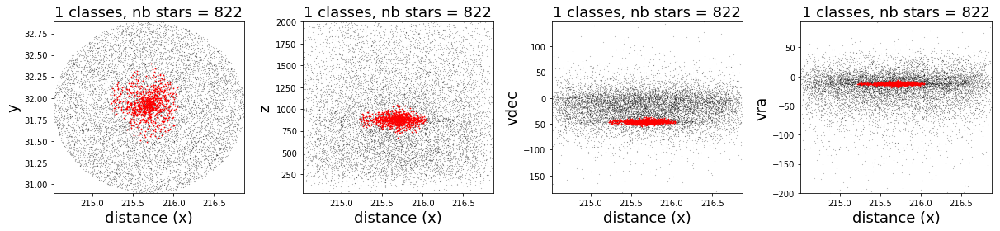

Mean Distance :215.68
Mean Vdec :-45.63
Mean Vra :-12.27


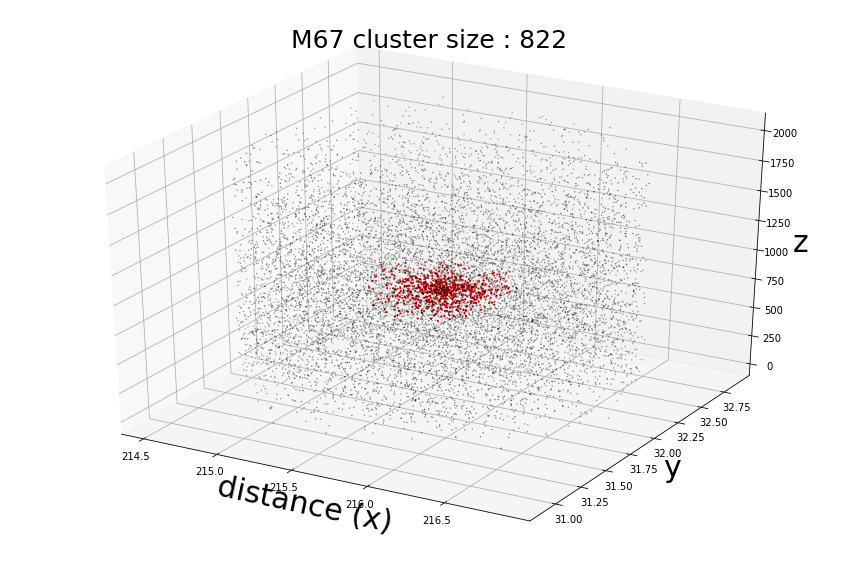

<function matplotlib.pyplot.scatter(x, y, s=None, c=None, marker=None, cmap=None, norm=None, vmin=None, vmax=None, alpha=None, linewidths=None, verts=None, edgecolors=None, hold=None, data=None, **kwargs)>

In [312]:
data_test = data
cluster_plot(data_test,ilabel,1,True)

affichage_cluster3D(data_test,ilabel,True,0.1,"M67")

plt.scatter

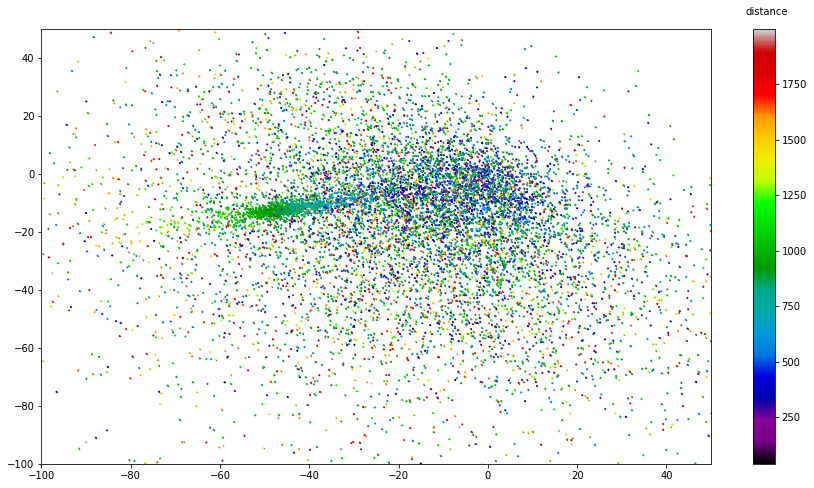

In [301]:
plt.figure(figsize=(15,8))
plt.scatter(data_test[:,3],data_test[:,4], s=0.1, c='k')
plt.scatter(data_test[:,3],data_test[:,4], s=1, c=data_test[:,2], cmap='nipy_spectral')
plt.xlim(-100,50)
plt.ylim(-100,50)
#plt.scatter(data_test[ilabel,3],data_test[ilabel,4], s=10, c=data_test[ilabel,2], cmap='gist_stern')
clb = plt.colorbar()
clb.set_label('distance', labelpad=-40, y=1.05, rotation=0)
plt.show()

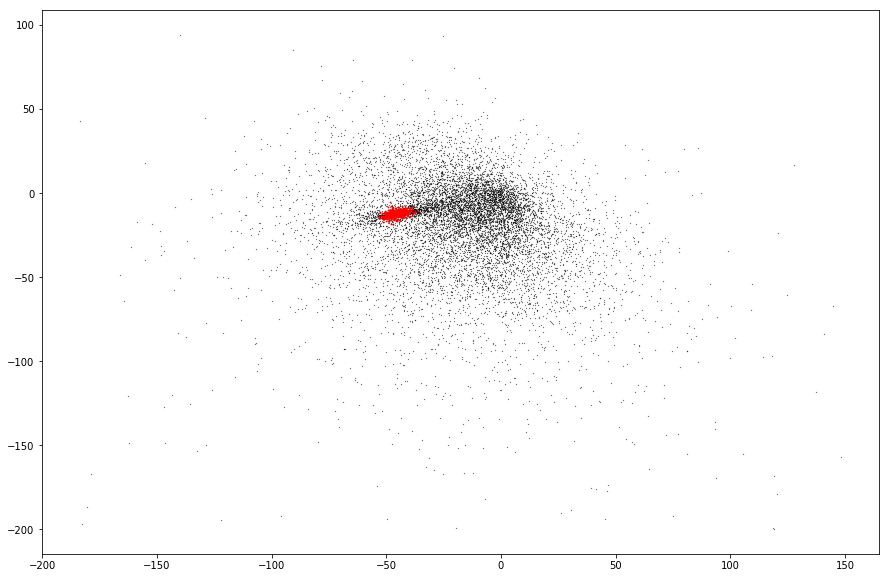

In [284]:
plt.figure(figsize=(15,10))
plt.scatter(data_test[:,3],data_test[:,4],s=0.05,c='k')
plt.scatter(data_test[ilabel,3],data_test[ilabel,4],s=0.5,c='r')
plt.show()

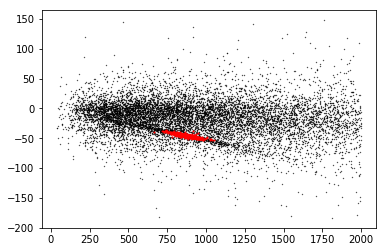

In [315]:
plt.scatter(data[:,2],data[:,3],c='k',s=0.1)
plt.scatter(data[ilabel,2],data[ilabel,3],c='r',s=1)
plt.show()

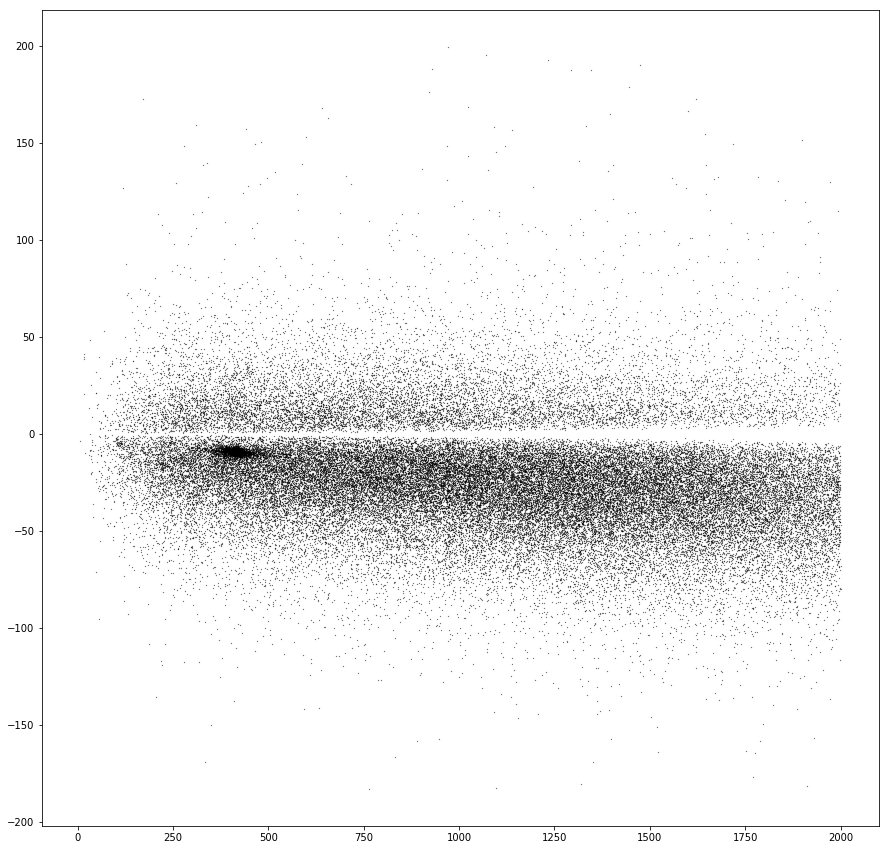

In [325]:
plt.figure(figsize=(15,15))
plt.scatter(data3[:,2],data3[:,3],c='k',s=0.05)
plt.show()

ValueError: Axis limits cannot be NaN or Inf

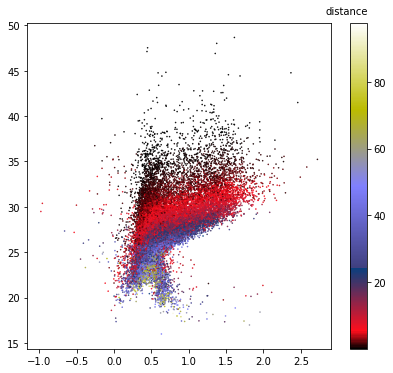

In [241]:
HRD(data_test[:,:], size=0.3, colorbar=True)
HRD(data_test[ilabel,:], size=0.5, colorbar=True)

# -------------------------------------------------------------

### Description in pandas variable 

In [133]:
d1 = {'lgal': datask[:,0], 'bgal': datask[:,1], 'distance': datask[:,2], 'vra': datask[:,3], 'vdec': datask[:,4]}
datapd = pd.DataFrame(data=d1)
d2 = {'lgal': datanor0[:,0], 'bgal': datanor0[:,1], 'distance': datanor0[:,2], 'vra': datanor0[:,3], 'vdec': datanor0[:,4]}
datapd_nor0 = pd.DataFrame(data=d2)
d3 = {'lgal': datanor1[:,0], 'bgal': datanor1[:,1], 'distance': datanor1[:,2], 'vra': datanor1[:,3], 'vdec': datanor1[:,4]}
datapd_nor1 = pd.DataFrame(data=d3)
d4 = {'lgal': datanor2[:,0], 'bgal': datanor2[:,1], 'distance': datanor2[:,2], 'vra': datanor2[:,3], 'vdec': datanor2[:,4]}
datapd_nor2 = pd.DataFrame(data=d4)

### Description for one element

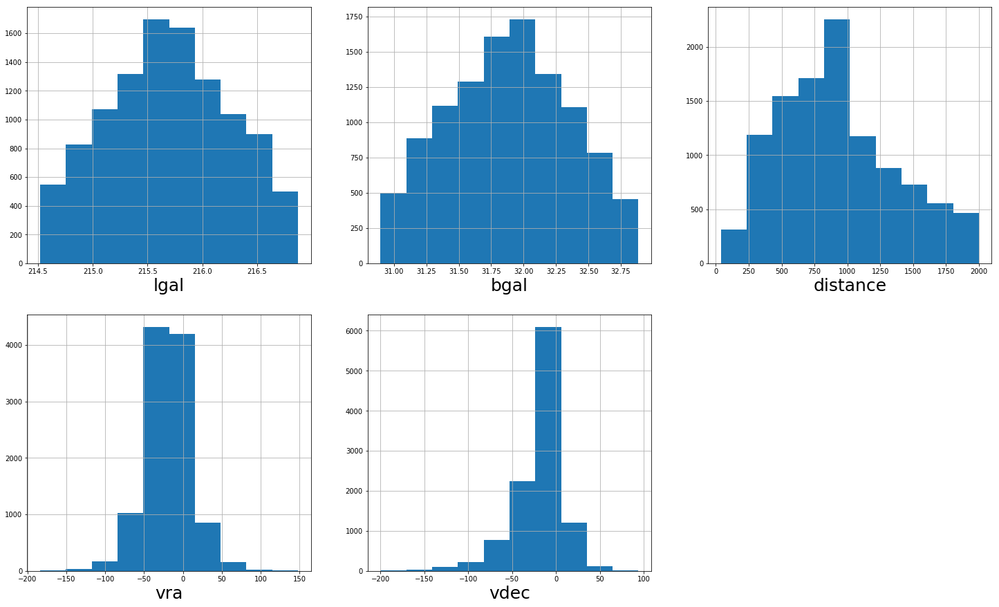

In [134]:
## Histogram
plt.figure(figsize=(25,15))
i = 1
for string in ('lgal','bgal','distance','vra','vdec'):
    plt.subplot(2,3,i)
    datapd[string].hist()
    plt.xlabel(string, fontsize=25)
    i+=1

<Figure size 1800x720 with 0 Axes>

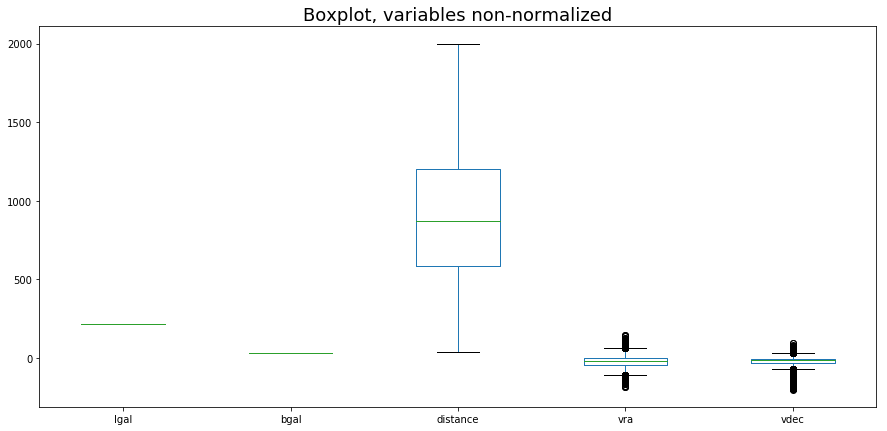

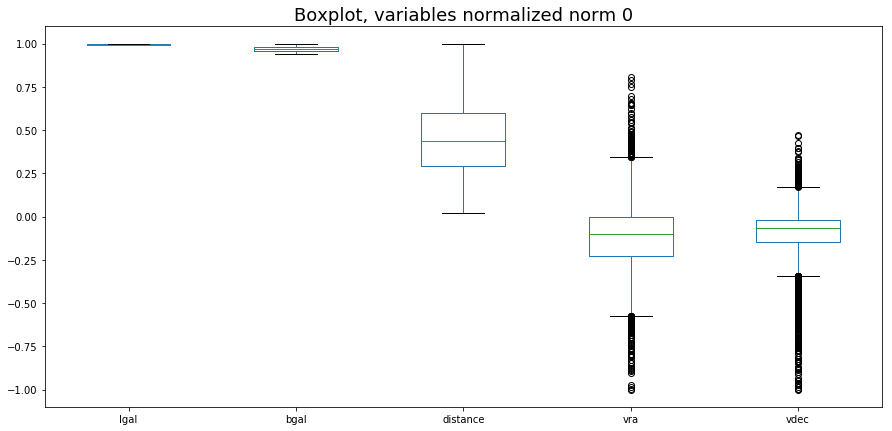

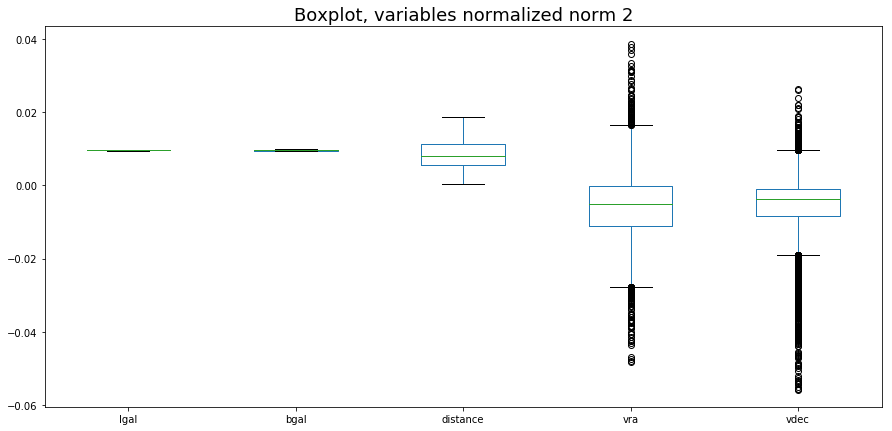

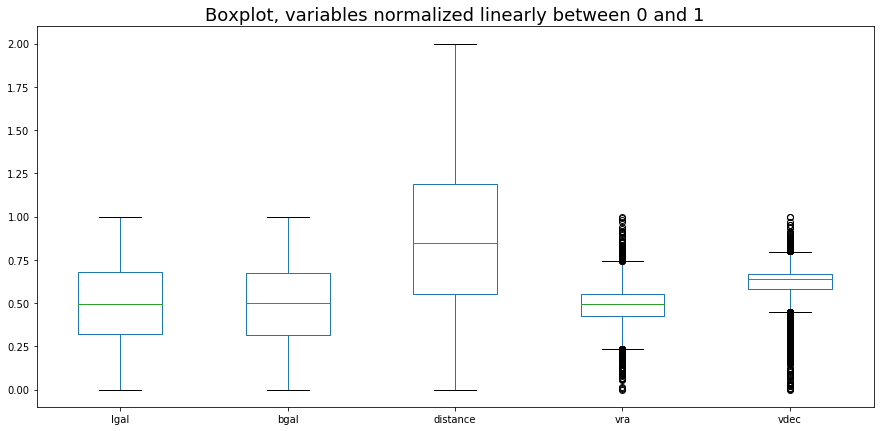

In [135]:
plt.figure(figsize=(25,10))

i = 1
string = ['non-normalized','normalized norm 0', 'normalized norm 2','normalized linearly between 0 and 1']
data_i = [datapd,datapd_nor1,datapd_nor1,datapd_nor2]
for data_i in (datapd,datapd_nor0,datapd_nor1,datapd_nor2):
    data_i.plot(kind = "box",figsize=(15, 7))
    plt.title("Boxplot, variables " + string[i-1], fontsize=18)
    i+=1


plt.show()

### Hierarchical Clustering Dendrogram

In [122]:
Z = linkage(datapd, 'ward', metric='euclidean') # choix de la distance
Z0 = linkage(datapd_nor0, 'ward', metric='euclidean') # choix de la distance
Z1 = linkage(datapd_nor1, 'ward', metric='euclidean') # choix de la distance
Z2 = linkage(datapd_nor2, 'ward', metric='euclidean') # choix de la distance

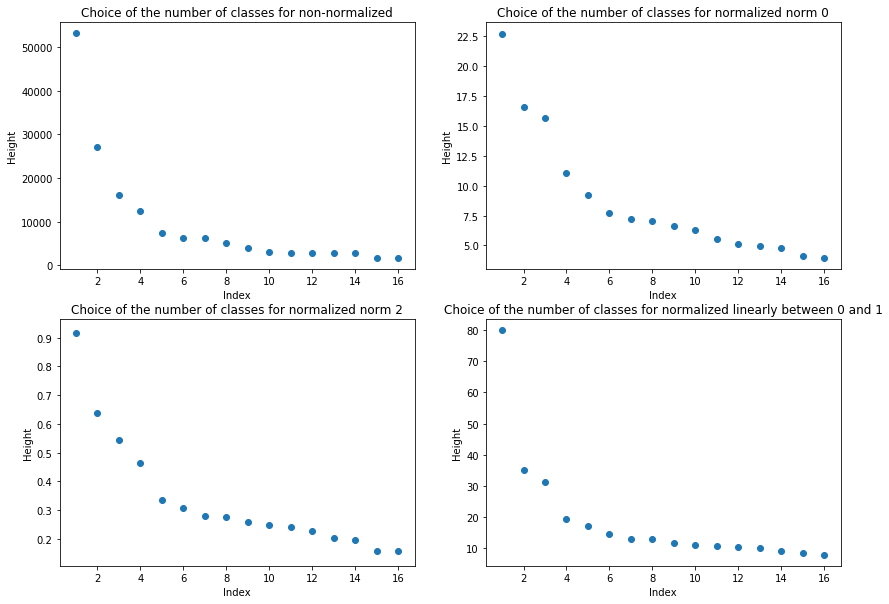

In [123]:
string = ['non-normalized','normalized norm 0', 'normalized norm 2','normalized linearly between 0 and 1']
Z_ = [Z,Z0,Z1,Z2]
t = np.zeros((16,4))
plt.figure(figsize=(14,10))
x=np.arange(16)+1
for i in range(4) :
    plt.subplot(2,2,i+1)
    height = Z_[i][:,2]
    height = sorted(height,reverse=True)
    plt.scatter(x,height[0:16])  #height[0:16]/sum(height[0:16])*100
    t[:,i] = height[0:16]
    plt.xlabel('Index')
    plt.ylabel('Height')
    plt.title("Choice of the number of classes for "+string[i])
plt.show()

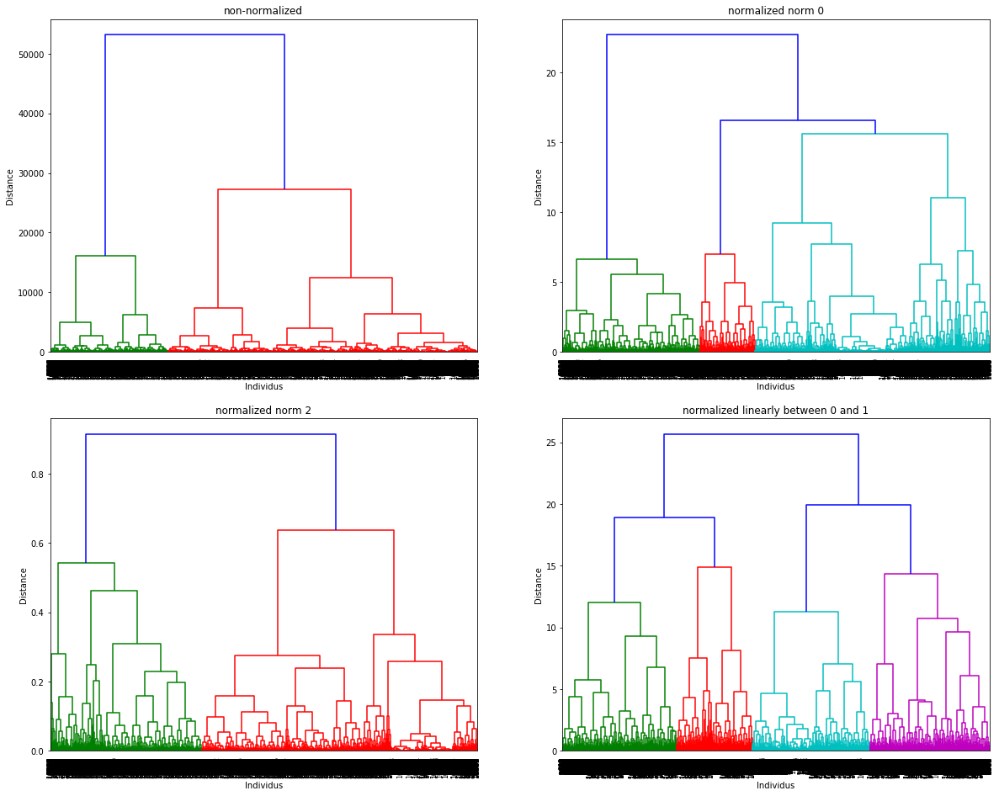

In [407]:
string = ['non-normalized','normalized norm 0', 'normalized norm 2','normalized linearly between 0 and 1']
Z_ = [Z,Z0,Z1,Z2]
data_ = [datapd, datapd_nor0, datapd_nor1, datapd_nor2]
plt.figure(figsize=(20,16))
x=np.arange(16)+1
for i in range(4) :
    plt.subplot(2,2,i+1)
    dendrogram(Z_[i],leaf_font_size=8.,labels=data_[i].index)
    plt.xlabel('Individus')
    plt.ylabel('Distance')
    plt.title(string[i])
plt.show()

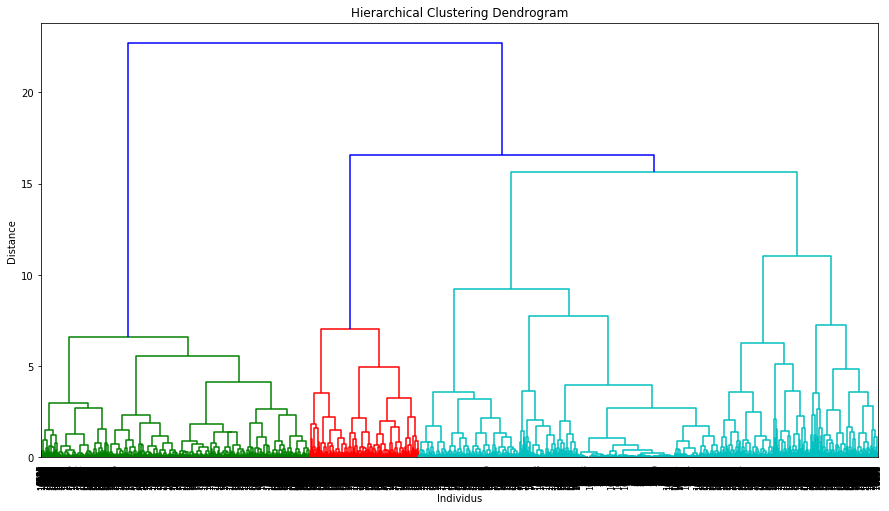

In [391]:
plt.figure(figsize=(15, 8))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Individus')
plt.ylabel('Distance')
dendrogram(Z,leaf_font_size=8.,labels=marsRech.index)
plt.show()

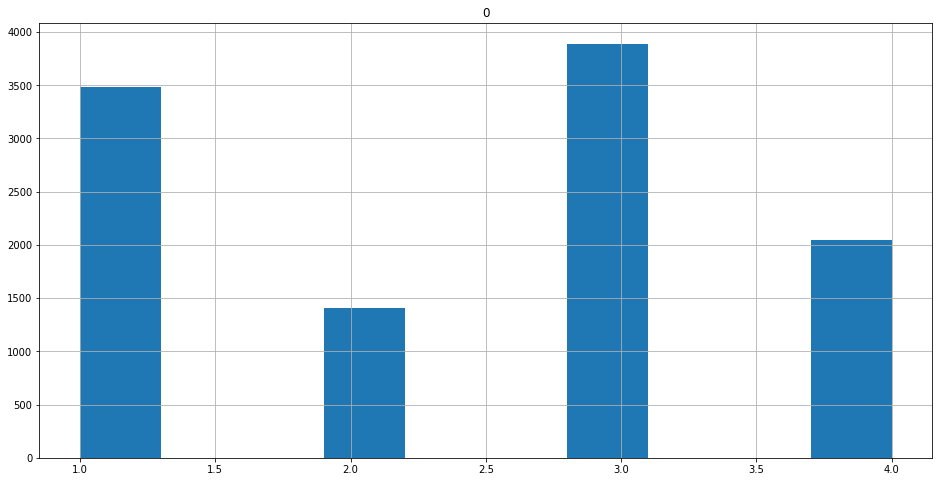

In [392]:
classesCAH = fcluster(Z,t=15,criterion='distance')
pd.DataFrame(classesCAH).hist()
plt.show()

In [251]:
print(classesCAH)

[3 3 3 ... 1 2 1]


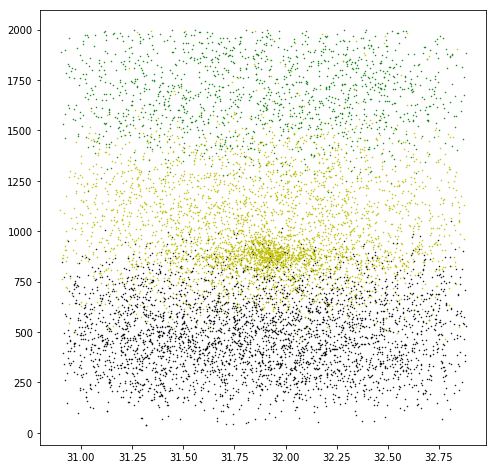

In [393]:
colors = ["r.","k.","g.","y.","b.","k.","b.","g.","y.","c.","r.","k.","g.","y.","w.","k.","b.","g.","y.","c.","r.","k.","g.","y.","w.","k.","b.","g.","y.","c."]
rcParams['figure.figsize'] = 8, 8

for i in range(4):
    ilabel = np.where(classesCAH == i)[0]
    plt.plot(datask[ilabel,1],datask[ilabel,2],colors[i],markersize=1)
    #plt.scatter(centroid_nor[0,0],centroid_nor[0,1],'y',markersize=10)
    
plt.show()

In [ ]:
colors = ["r.","k.","g.","y.","b.","k.","b.","g.","y.","c.","r.","k.","g.","y.","w.","k.","b.","g.","y.","c.","r.","k.","g.","y.","w.","k.","b.","g.","y.","c."]
rcParams['figure.figsize'] = 16, 8

i1 = 1
i2 = 2
string = ['non-normalized','normalized norm 0', 'normalized norm 2','normalized linearly between 0 and 1']
plt.figure(figsize=(25,22))
centro = [centroid,centroid_nor0,centroid_nor1,centroid_nor2]


for i in range(nclust):
    plt.subplot(4,3,i+1)
    ilabel = np.where(labels_nor0 == i)[0]
    plt.plot(datask[labels_nor0,i1],datask[labels_nor0,i2],colors[i],markersize=1)
    plt.plot(centroid_nor0[i,i1],centroid_nor0[i,i2],colors[i],markersize=19)
    plt.xlabel("bgal", fontsize=22)
    plt.ylabel("distance", fontsize=22)
    plt.title("cluste num. " + str(j), fontsize=22)
    
plt.show()